## Stock Market - Prediction

### Introduction
One of the essential steps in any financial analysis or investment strategy development is obtaining reliable and accurate data. Yahoo Finance is a popular platform that provides a wealth of financial market data. Thankfully, there's a Python library called yfinance that simplifies the process of downloading stock data from Yahoo Finance.

### Installing yfinance Library
Before we start fetching data, you'll need to install the yfinance library. You can install it using pip:

In [ ]:
# pip install yfinance

### Getting the Data

In [87]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('whitegrid')
plt.style.use("fivethirtyeight")
%matplotlib inline

# For reading stock data from yahoo
import yfinance as yf

yf.pdr_override()

# For time stamps
from datetime import datetime

# The Indian stocks we'll use for this analysis
stock_list = [
    'COFFEEDAY.NS', 'PKTEA.NS', 'USHAMART.NS', 'IOC.NS', 'SATIA.NS',
    'BHARTIARTL.NS', 'TVSSRICHAK.NS', 'AMRUTANJAN.NS', 'DGCONTENT.NS',
    'INDLMETER.NS', 'M&M.NS', 'TIRUMALCHM.NS', 'BALLARPUR.NS', 'HATHWAY.NS', 'ITC.NS'
]

# Set up End and Start times for data grab
end = datetime.now()
start = datetime(end.year - 1, end.month, end.day)

# Fetch data for each stock
for stock in stock_list:
    globals()[stock.split('.')[0]] = yf.download(stock, start, end)

# Combine data into a single dataframe and add company names
company_list = [globals()[stock.split('.')[0]] for stock in stock_list]
company_name = [
    'COFFEEDAY', 'PKTEA', 'USHAMART', 'IOC', 'SATIA',
    'BHARTIARTL', 'TVSSRICHAK', 'AMRUTANJAN', 'DGCONTENT',
    'INDLMETER', 'M&M', 'TIRUMALCHM', 'BALLARPUR', 'HATHWAY', 'ITC'
]

for company, com_name in zip(company_list, company_name):
    company["company_name"] = com_name
    
df = pd.concat(company_list, keys=company_name, axis=0)
df.tail(10)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%*******

Open        High         Low       Close   Adj Close  \
    Date                                                                     
ITC 2024-04-02  428.700012  428.700012  424.600006  425.850006  425.850006   
    2024-04-03  426.000000  428.799988  421.000000  425.200012  425.200012   
    2024-04-04  425.549988  427.350006  419.899994  422.750000  422.750000   
    2024-04-05  422.500000  431.700012  419.950012  427.549988  427.549988   
    2024-04-08  428.299988  431.399994  427.750000  429.100006  429.100006   
    2024-04-09  430.450012  431.500000  425.549988  426.350006  426.350006   
    2024-04-10  428.299988  437.799988  425.750000  436.950012  436.950012   
    2024-04-12  435.000000  435.750000  428.299988  430.100006  430.100006   
    2024-04-15  428.000000  429.149994  422.899994  425.899994  425.899994   
    2024-04-16  423.250000  427.000000  423.200012  425.899994  425.899994   

                  Volume company_name  
    Date                               
ITC 2024-04-02   8853678          ITC  
    2024-04-03  12664520          ITC  
    2024-04-04  18358410          ITC  
    2024-04-05  16147032          ITC  
    2024-04-08   8516632          ITC  
    2024-04-09   6708894          ITC  
    2024-04-10  14008124          ITC  
    2024-04-12  18088372          ITC  
    2024-04-15   8746243          ITC  
    2024-04-16   9973638          ITC

In [70]:
# Creating a sample data for reference
df.to_csv("Sample_stocks_data_18_April.csv", index=False)
df = pd.read_csv("Sample_stocks_data_18_April.csv")
df.head()

,Open,High,Low,Close,Adj Close,Volume,company_name
0,32.500000,33.900002,32.500000,32.950001,32.950001,1913920,COFFEEDAY
1,32.799999,33.250000,32.200001,32.549999,32.549999,896676,COFFEEDAY
2,32.549999,32.849998,31.650000,31.799999,31.799999,804523,COFFEEDAY
3,31.850000,33.250000,30.900000,32.049999,32.049999,2097443,COFFEEDAY
4,32.099998,32.200001,31.799999,32.000000,32.000000,577064,COFFEEDAY


In [71]:
# stocks considered
df['company_name'].unique()

array(['COFFEEDAY', 'PKTEA', 'USHAMART', 'IOC', 'SATIA', 'BHARTIARTL',
       'TVSSRICHAK', 'AMRUTANJAN', 'DGCONTENT', 'INDLMETER', 'M&M',
       'TIRUMALCHM', 'BALLARPUR', 'HATHWAY', 'ITC'], dtype=object)

In [72]:
# Summary Stats
df.describe()

,Open,High,Low,Close,Adj Close,Volume
count,3685.000000,3685.000000,3685.000000,3685.000000,3685.000000,3.685000e+03
mean,578.128734,586.491089,570.157088,577.758528,575.739514,4.298095e+06
std,944.172925,959.922155,929.765689,943.509872,941.396060,9.459315e+06
min,2.950000,2.950000,2.900000,2.950000,2.950000,0.000000e+00
25%,56.400002,57.950001,54.849998,56.450001,56.450001,9.699000e+03
50%,257.575775,257.575775,257.575745,257.575775,257.575775,5.425110e+05
75%,600.000000,605.900024,595.000000,599.400024,597.200378,4.431992e+06
max,5076.299805,5097.000000,4958.000000,5053.049805,5053.049805,1.087198e+08


In [73]:
# General info
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3685 entries, 0 to 3684
Data columns (total 7 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Open          3685 non-null   float64
 1   High          3685 non-null   float64
 2   Low           3685 non-null   float64
 3   Close         3685 non-null   float64
 4   Adj Close     3685 non-null   float64
 5   Volume        3685 non-null   int64  
 6   company_name  3685 non-null   object 
dtypes: float64(5), int64(1), object(1)
memory usage: 201.7+ KB


## Closing Price
The closing price is the last price at which the stock is traded during the regular trading day. A stock’s closing price is the standard benchmark used by investors to track its performance over time.

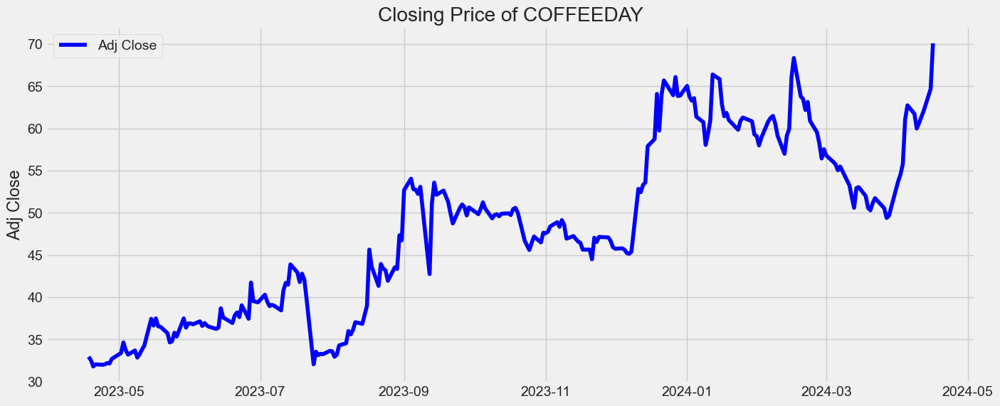

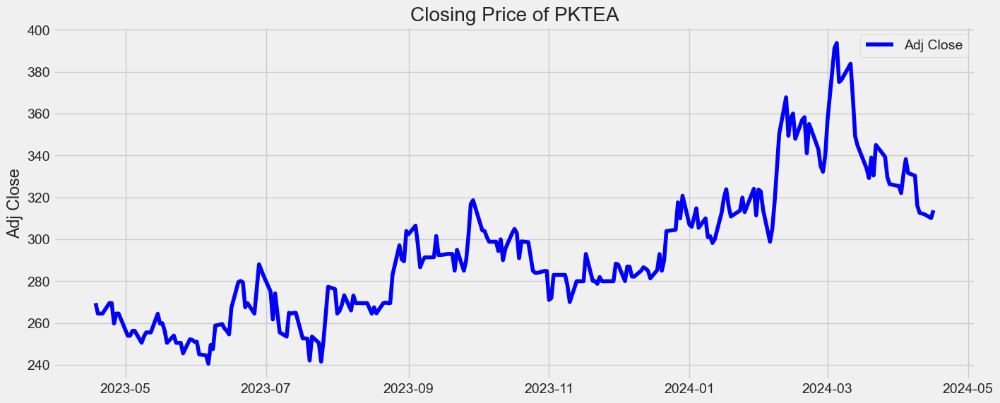

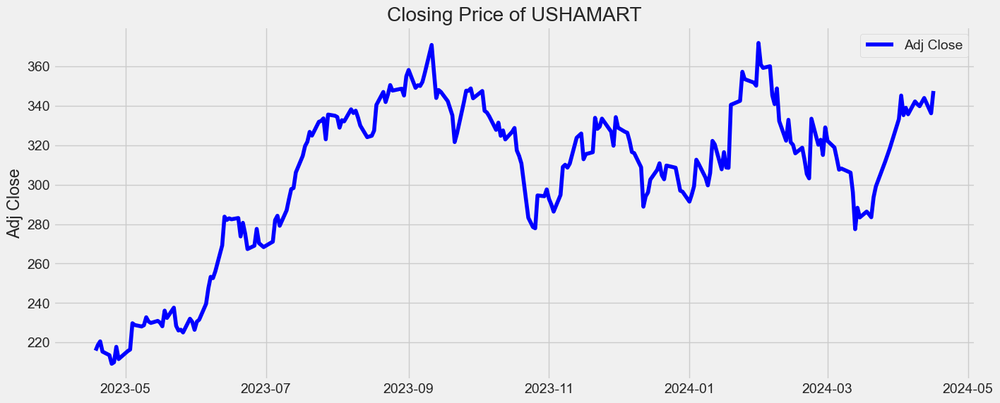

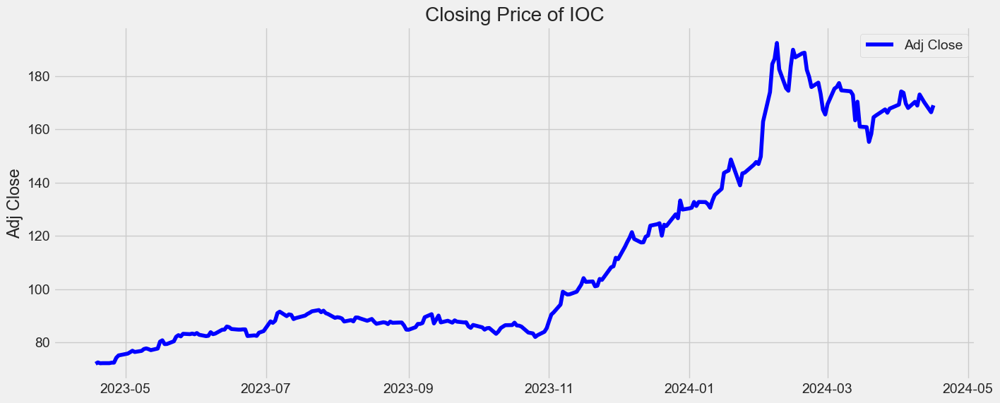

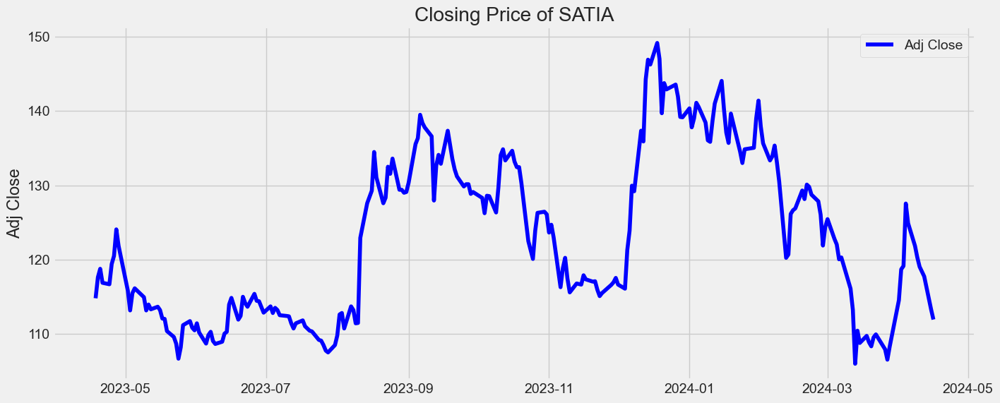

...

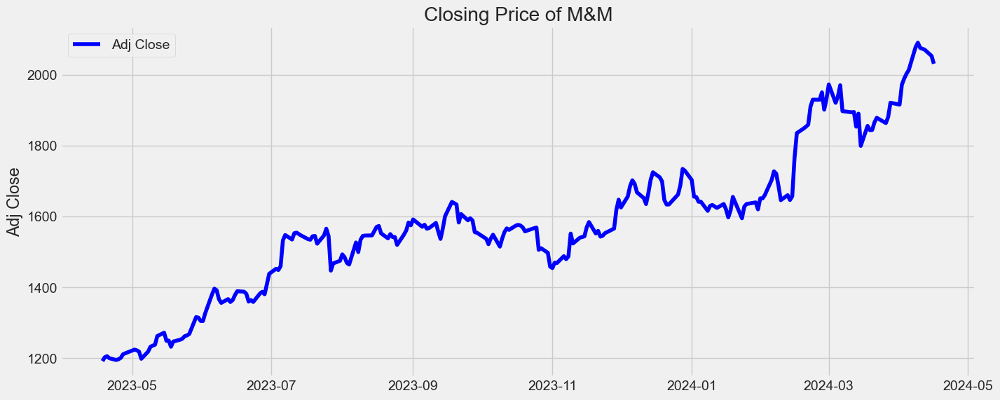

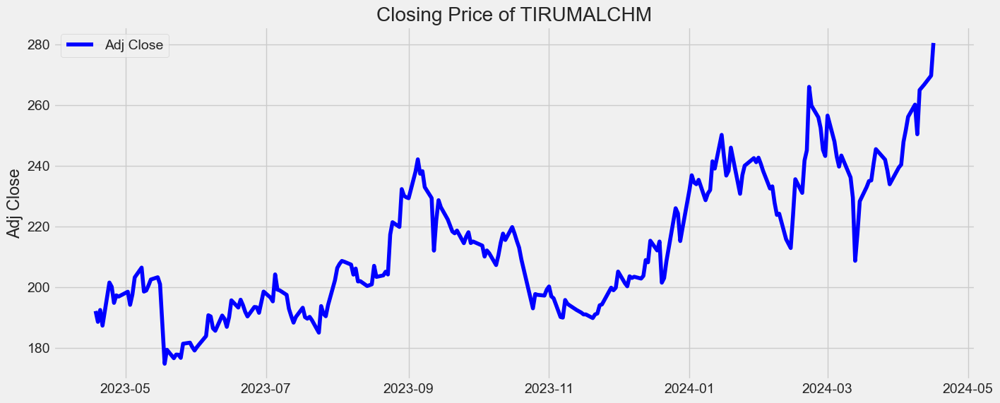

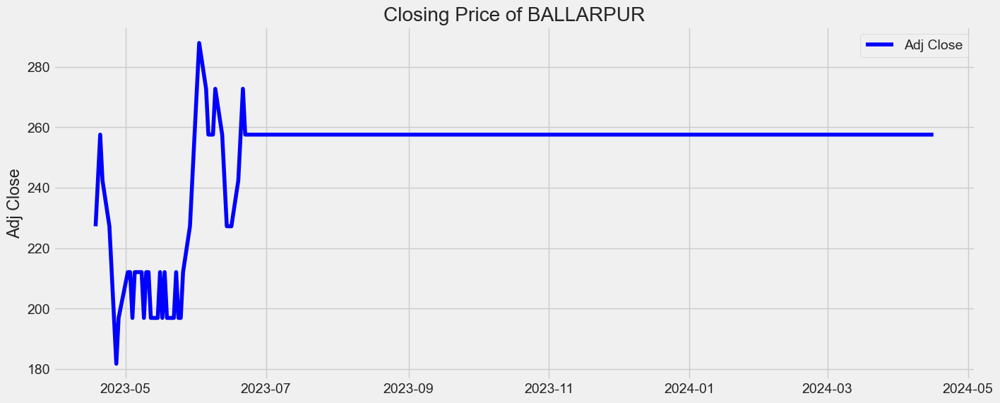

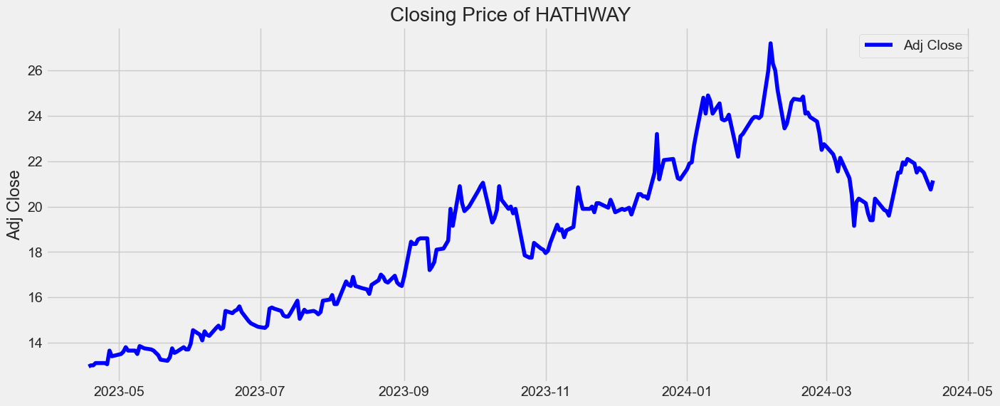

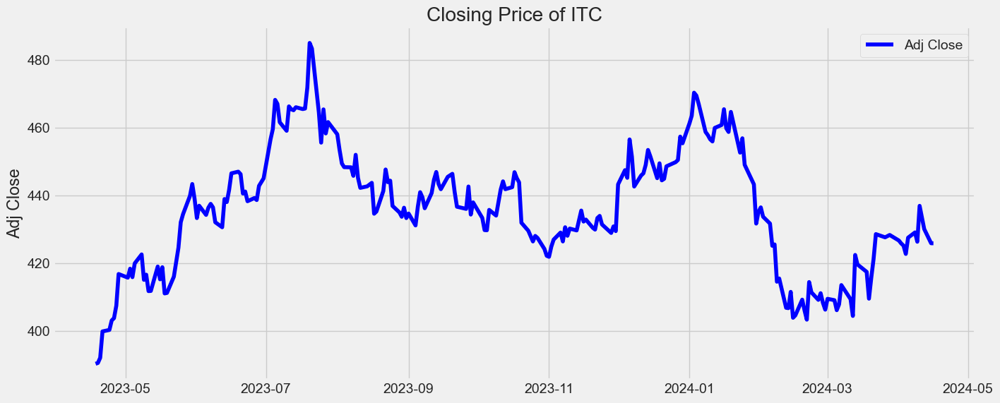

In [88]:
import matplotlib.pyplot as plt

def plot_close(company_name, company_data):
    plt.figure(figsize=(15, 10))
    plt.subplots_adjust(top=5, bottom=4.5)
    
    plt.plot(company_data['Adj Close'], label='Adj Close', color='b')
    
    plt.ylabel('Adj Close')
    plt.xlabel(None)
    plt.title(f"Closing Price of {company_name}")
    plt.legend()
    plt.show()


for com in company_name:
    company_data = globals()[com] 
    plot_close(com, company_data)
    
# Save the chart as an image
# plt.savefig('closing_price.png', dpi=300)


## Volume Sales
Volume measures how many shares of a stock are bought and sold in a given time, like a day. It's important for traders because it shows how active a stock is. High volume can indicate strong interest, while low volume might mean less interest.

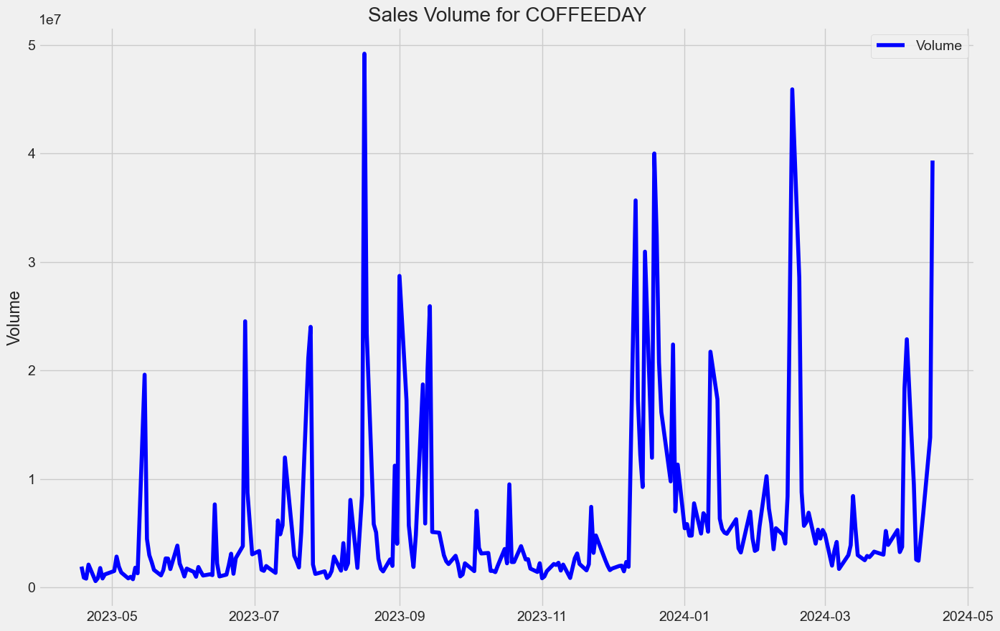

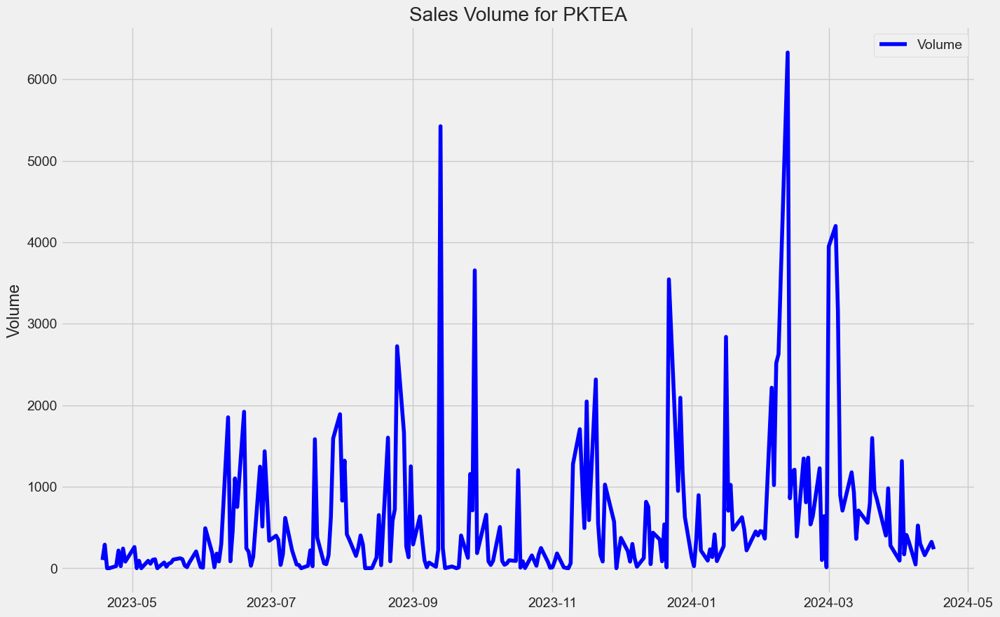

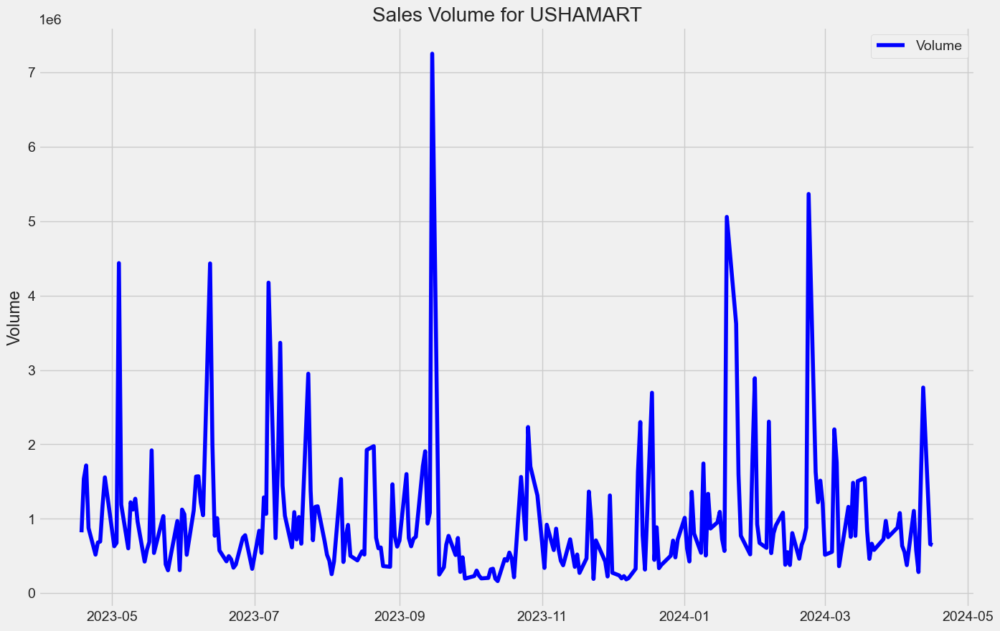

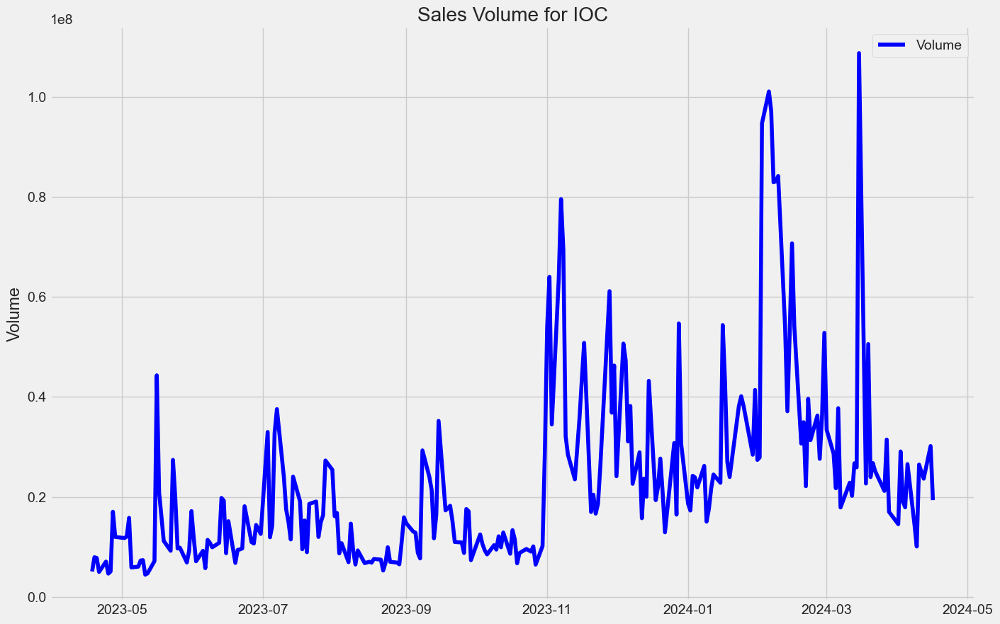

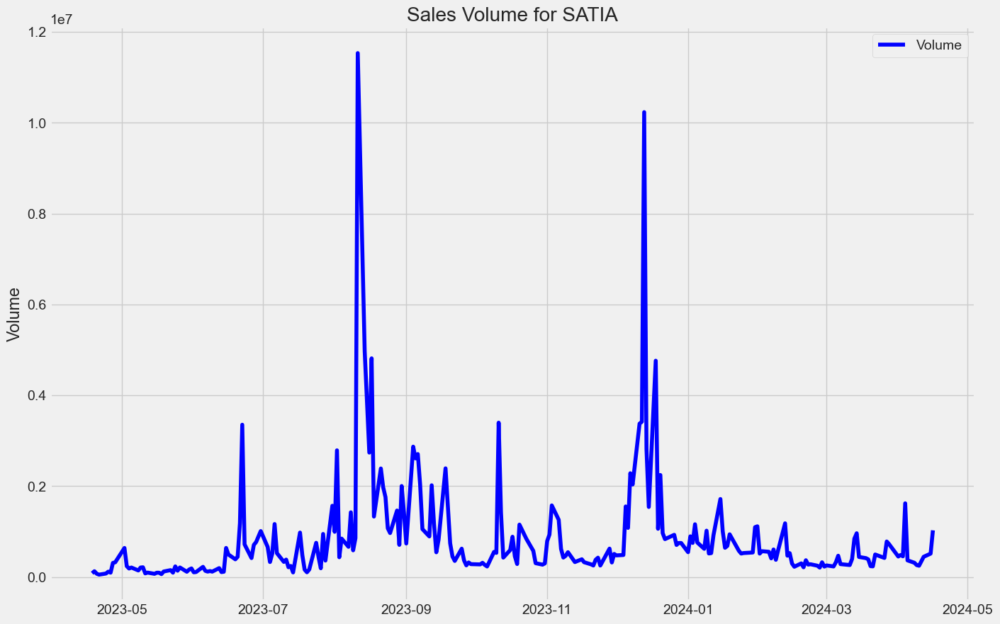

...

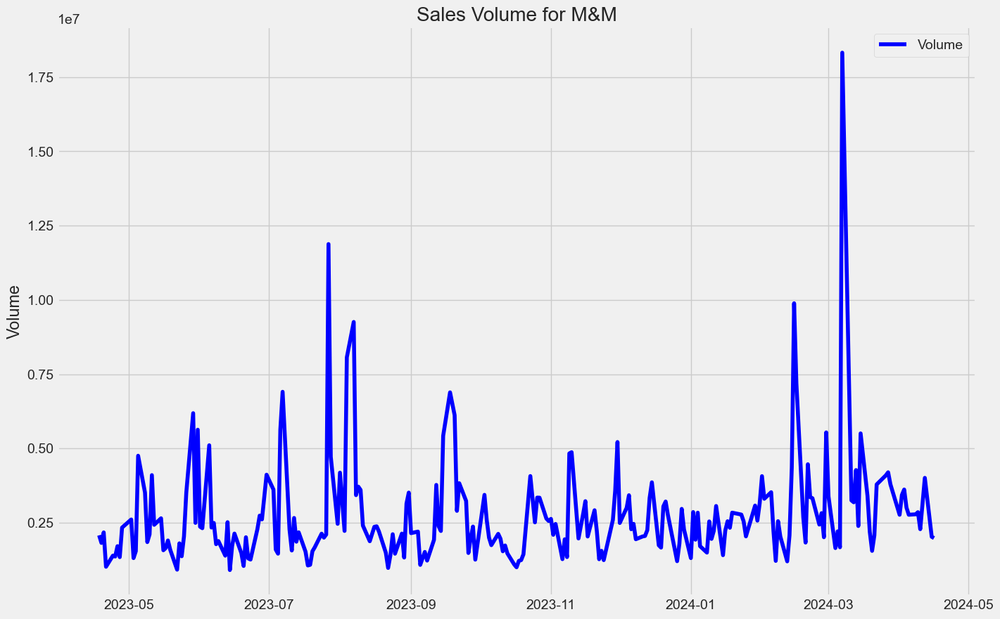

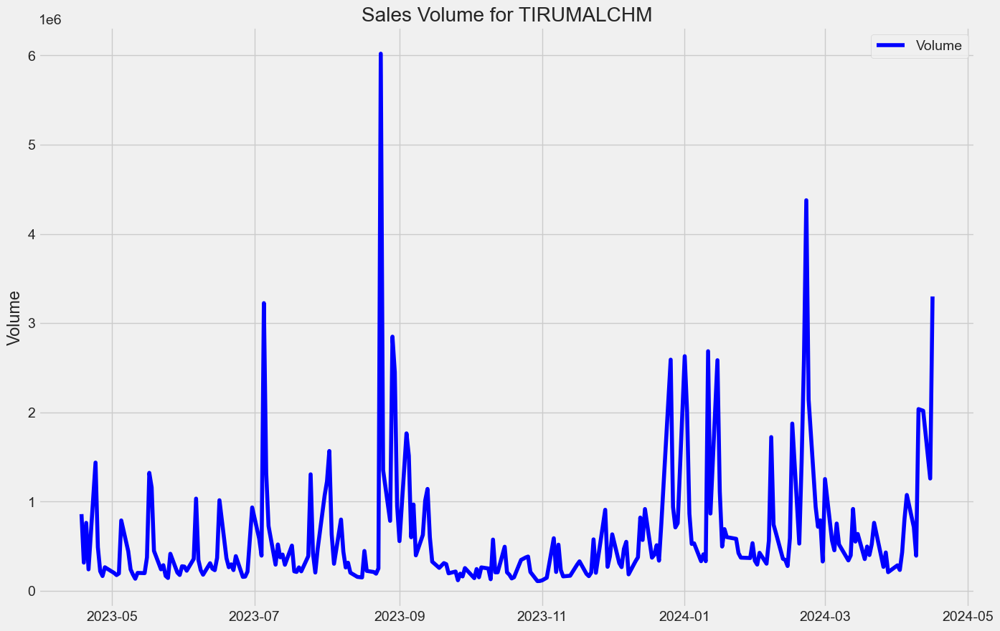

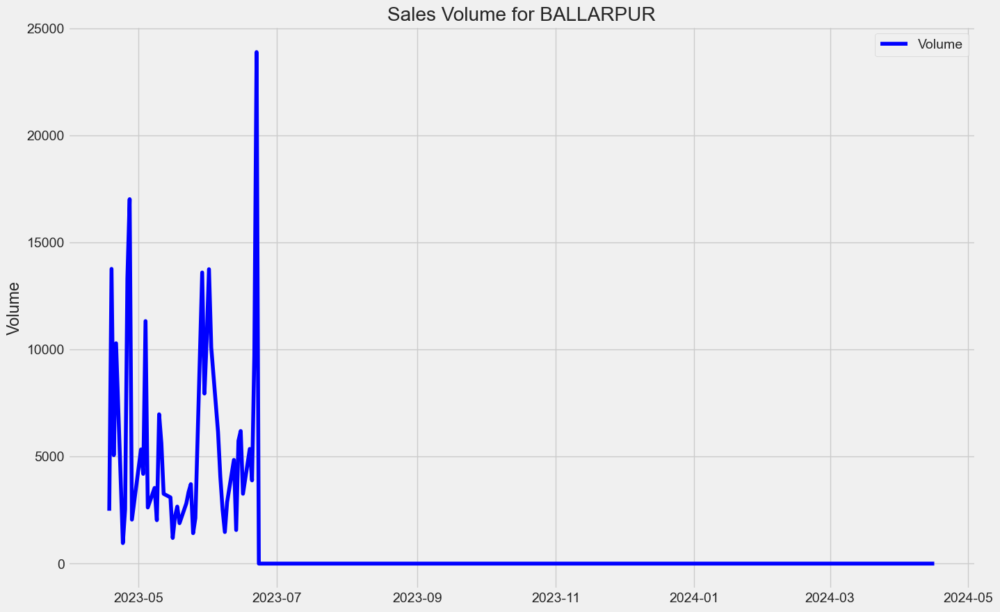

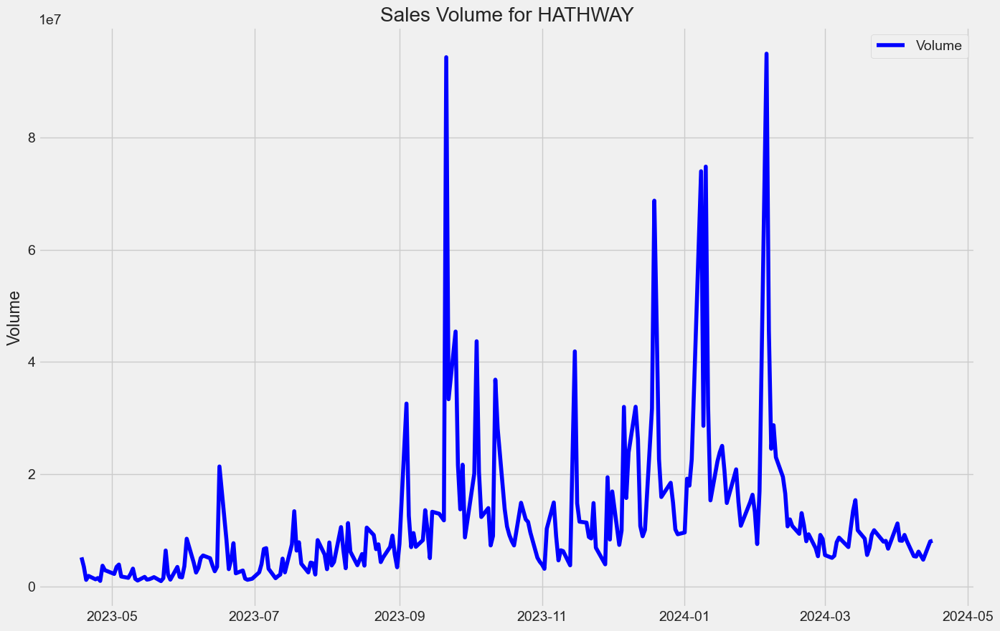

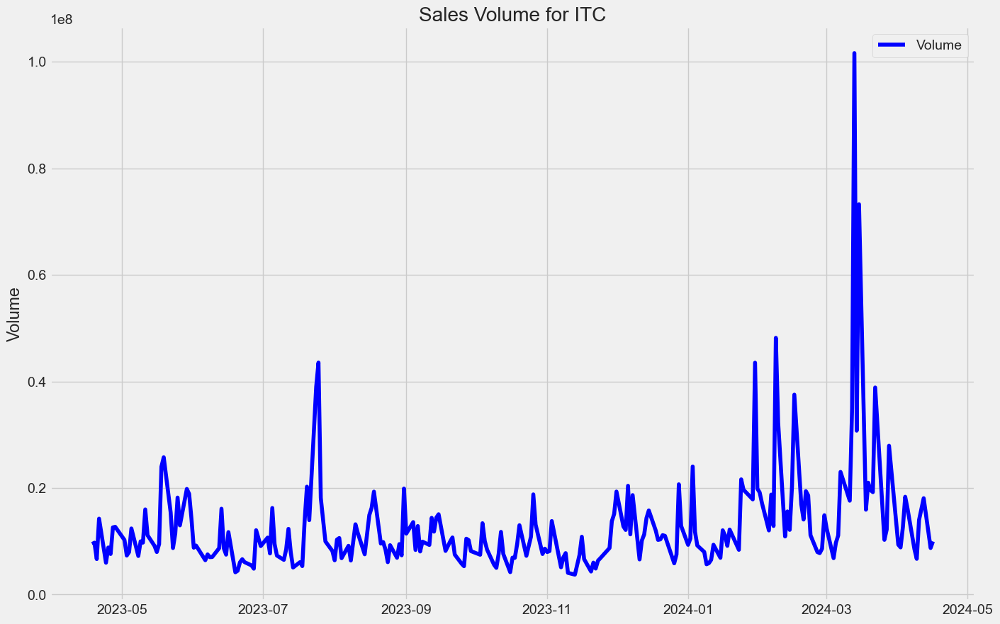

In [91]:
def plot_volume(company_df, company_name):
    plt.figure(figsize=(15, 10))
    
    plt.plot(company_df['Volume'], label='Volume', color='b')
    plt.ylabel('Volume')
    plt.xlabel(None)  # No xlabel
    plt.title(f"Sales Volume for {company_name}")
    plt.legend()
    plt.grid(True)
    plt.show()

    
for com in company_name:
    company_data = globals()[com] 
    plot_volume(company_data, com)    

## Moving average

The moving average (MA) is like a filter for price data in trading. It gives you an average price over a certain time, like 10 days or 20 days. This helps traders see the overall trend of the price without all the ups and downs that happen every day. So, it's a way to smooth out the price chart and make it easier to understand where the price might be heading.

We are analysis the moving average for 10, 20 and 50 days

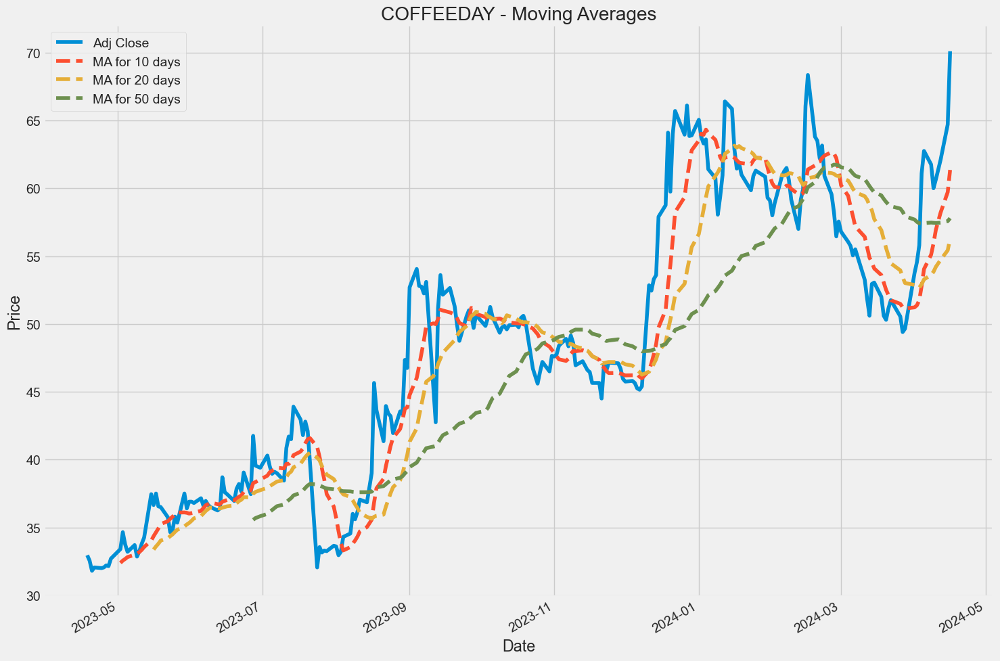

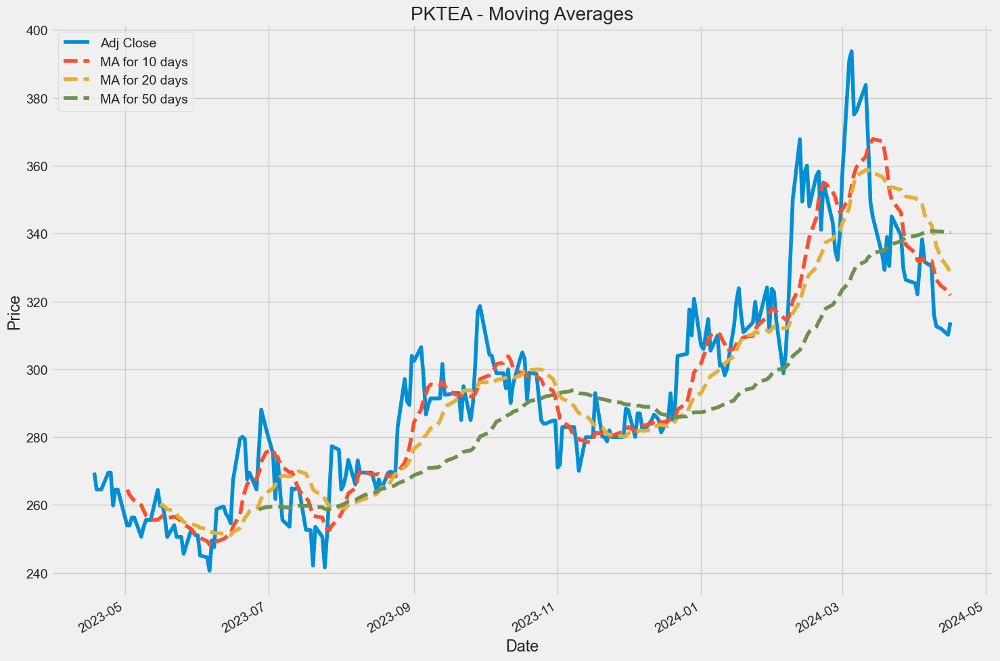

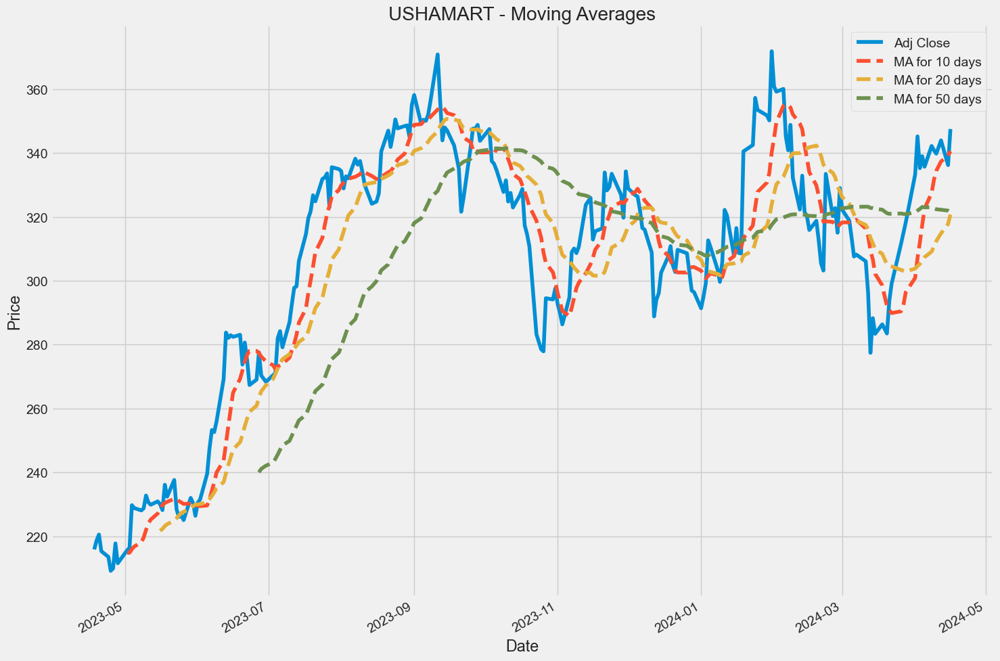

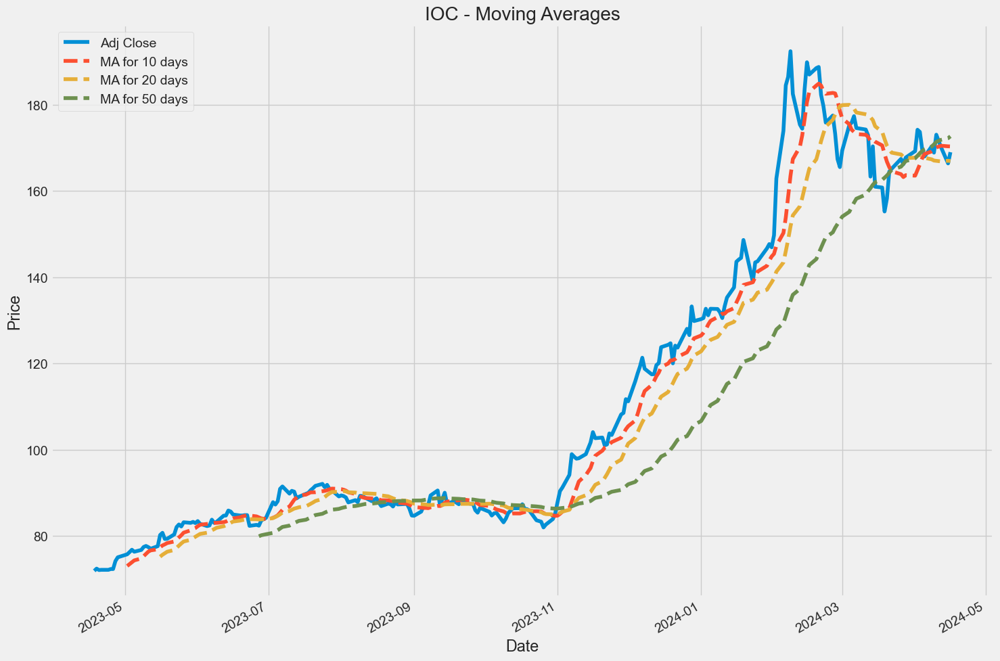

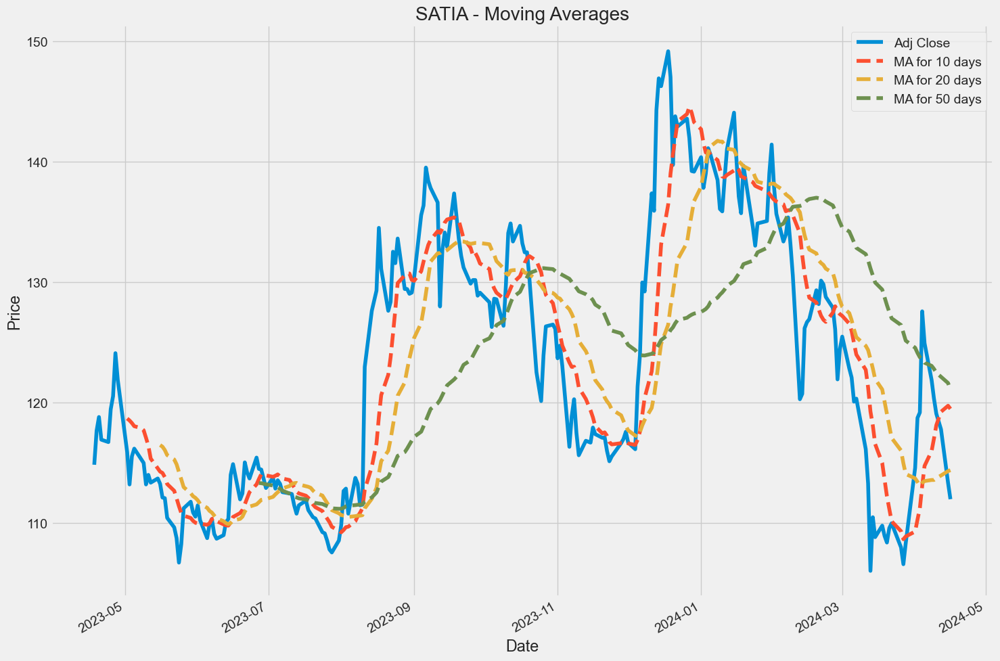

...

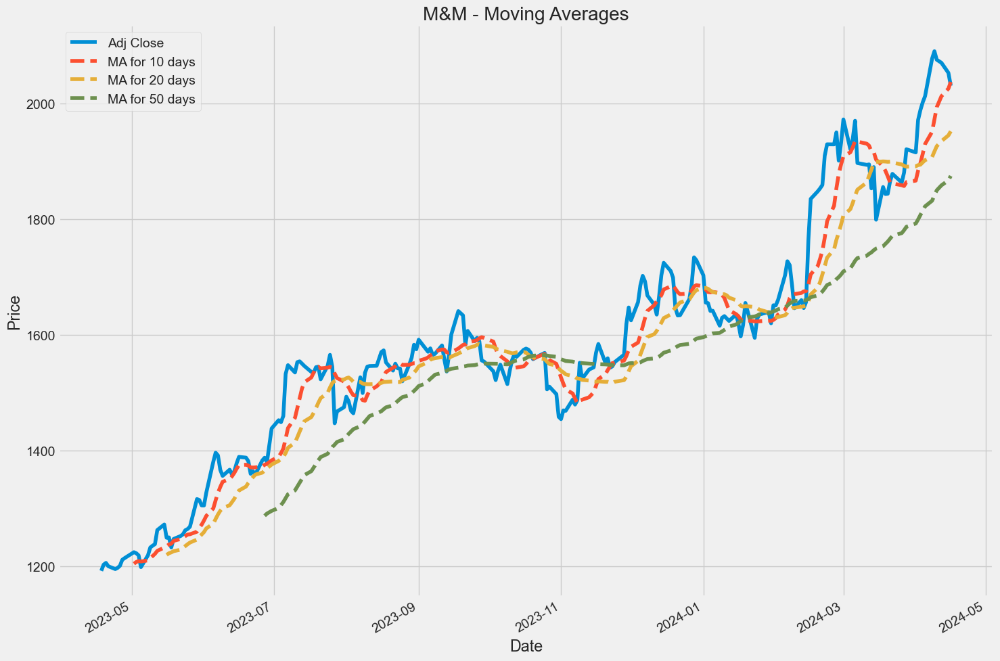

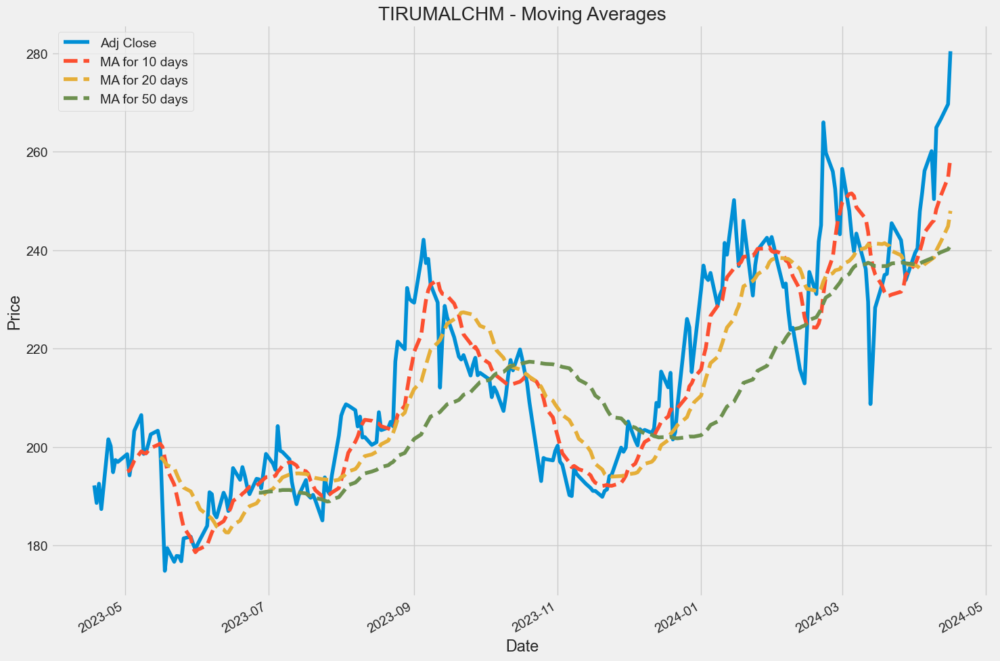

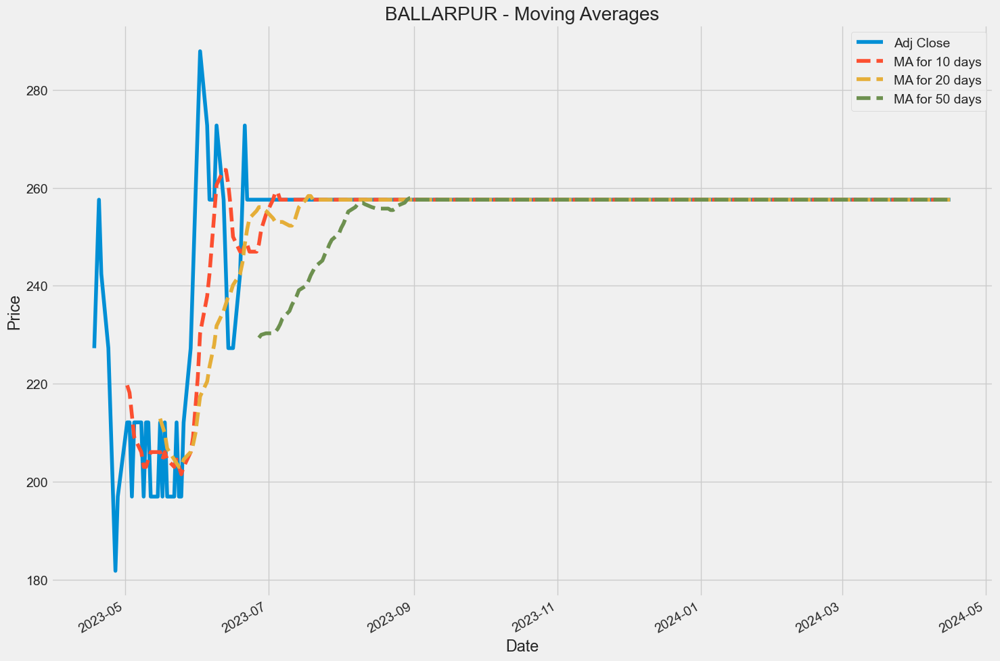

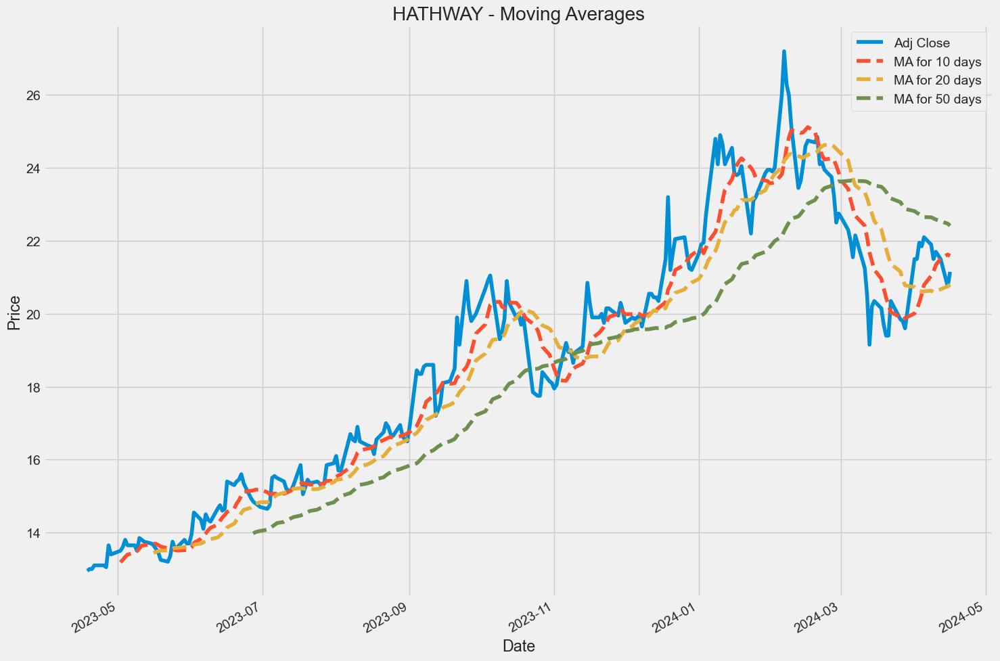

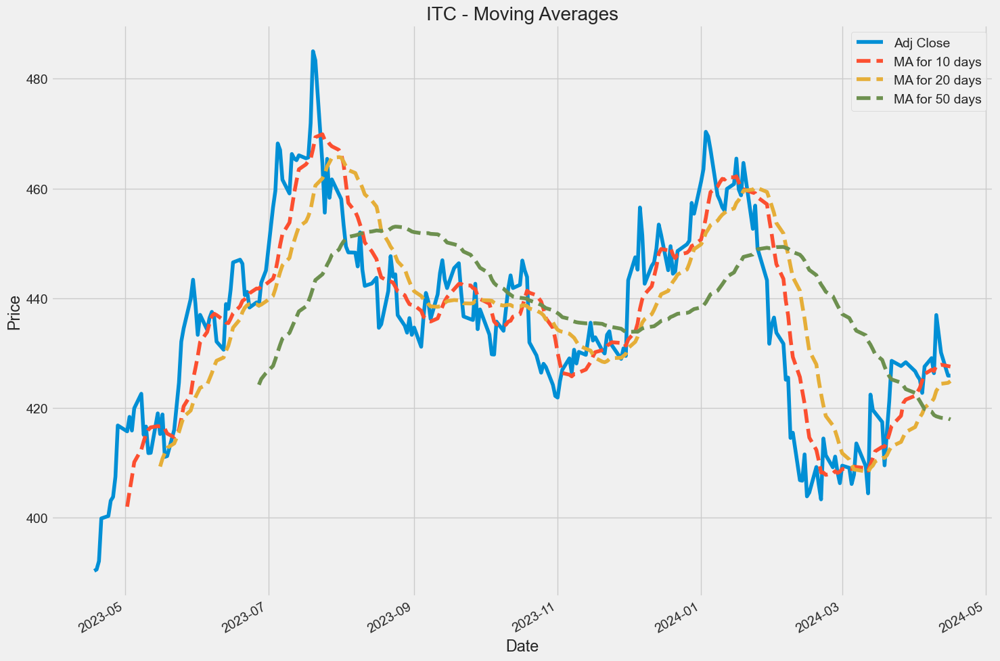

In [94]:
def plot_moving_average(company_df, company_name):
    ma_day = [10, 20, 50]
    
    # Calculate Moving Averages
    for ma in ma_day:
        column_name = f"MA for {ma} days"
        company_df[column_name] = company_df['Adj Close'].rolling(ma).mean()
    
    # Plotting
    plt.figure(figsize=(15, 10))
    
    company_df['Adj Close'].plot(label='Adj Close')
    
    company_df['MA for 10 days'].plot(label='MA for 10 days', linestyle='--')
    company_df['MA for 20 days'].plot(label='MA for 20 days', linestyle='--')
    company_df['MA for 50 days'].plot(label='MA for 50 days', linestyle='--')
    
    plt.title(f"{company_name} - Moving Averages")
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend()
    plt.grid(True)
    
    plt.tight_layout()
    plt.show()


    
for com in company_name:
    company_data = globals()[com] 
    plot_moving_average(company_data, com) 

## Average Daily return


We're now going to analyze the risk of the stock. To do this, we'll take a closer look at the daily changes in the stock price, not just its absolute value. Let's use pandas to retrieve the daily returns for the stocks.

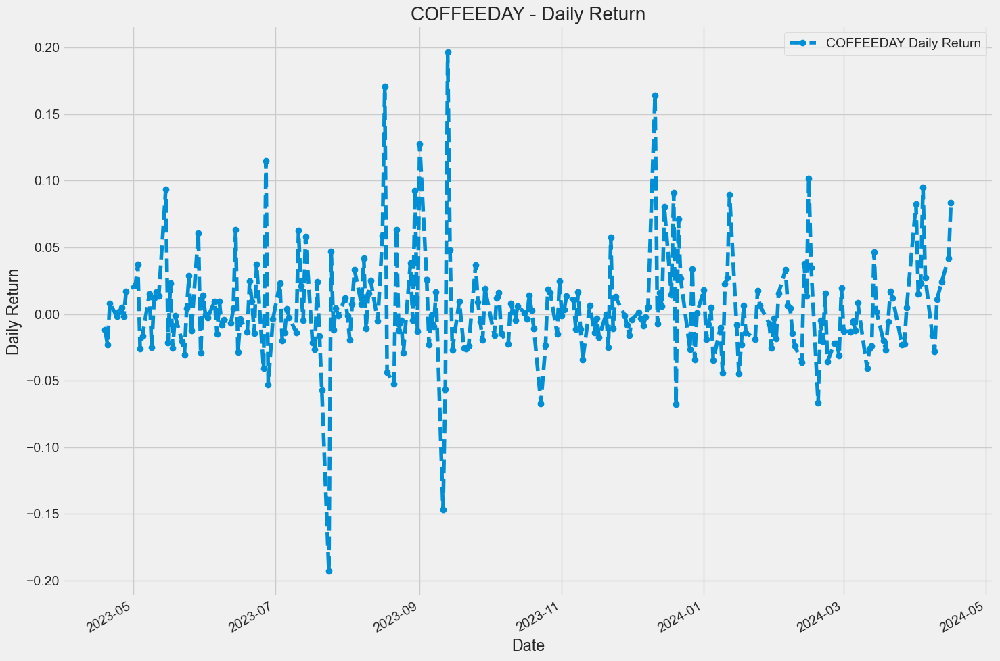

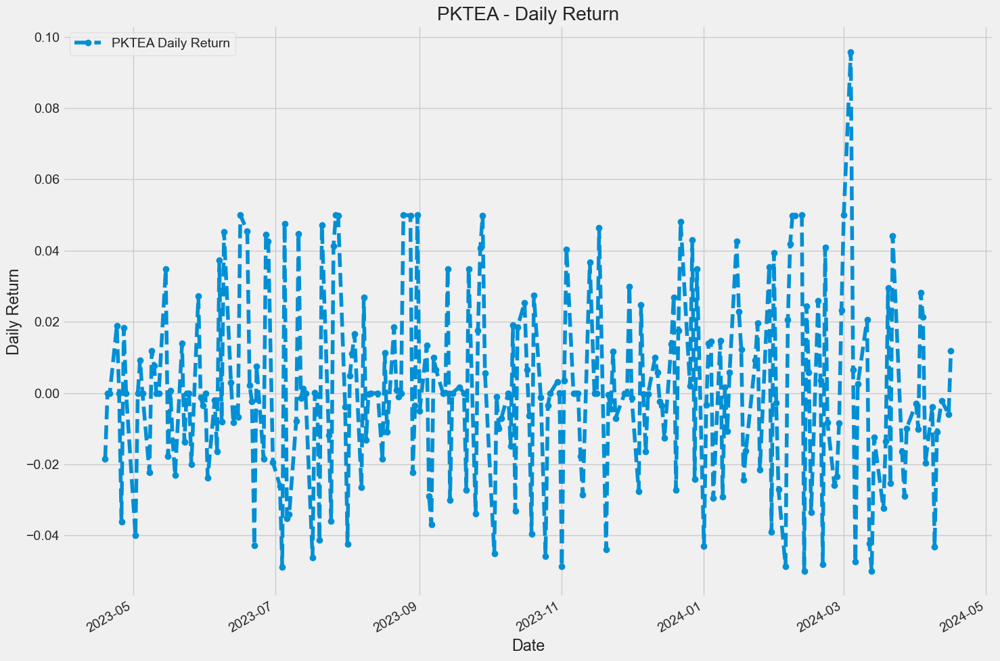

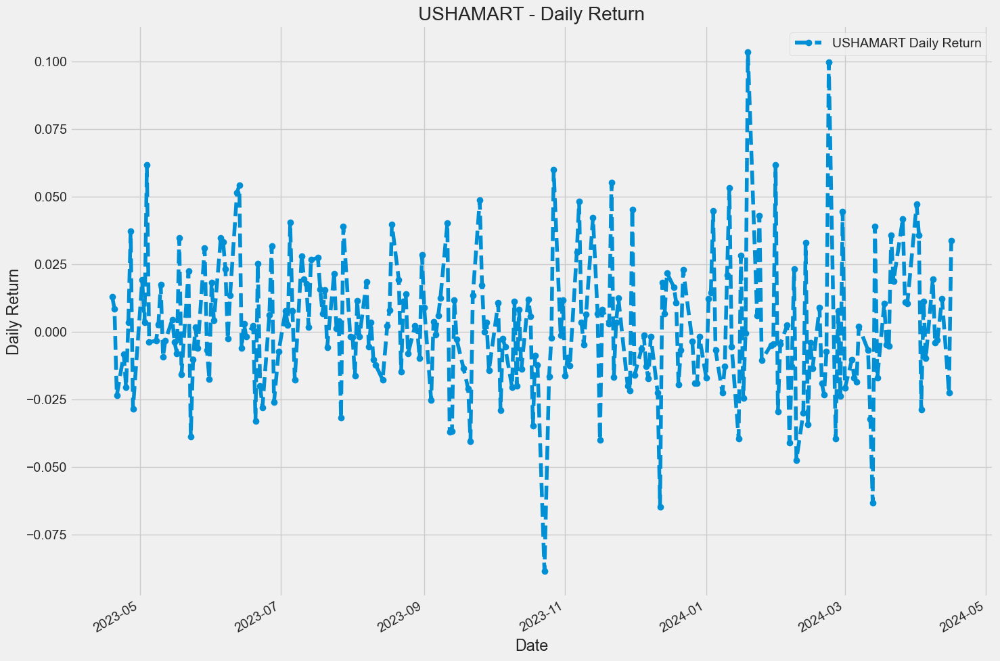

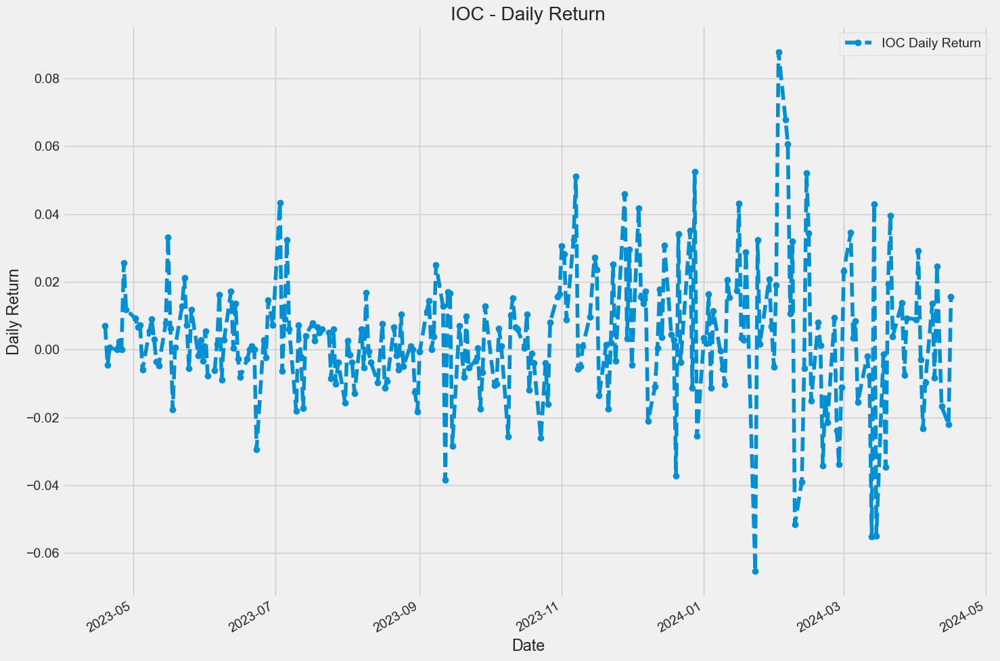

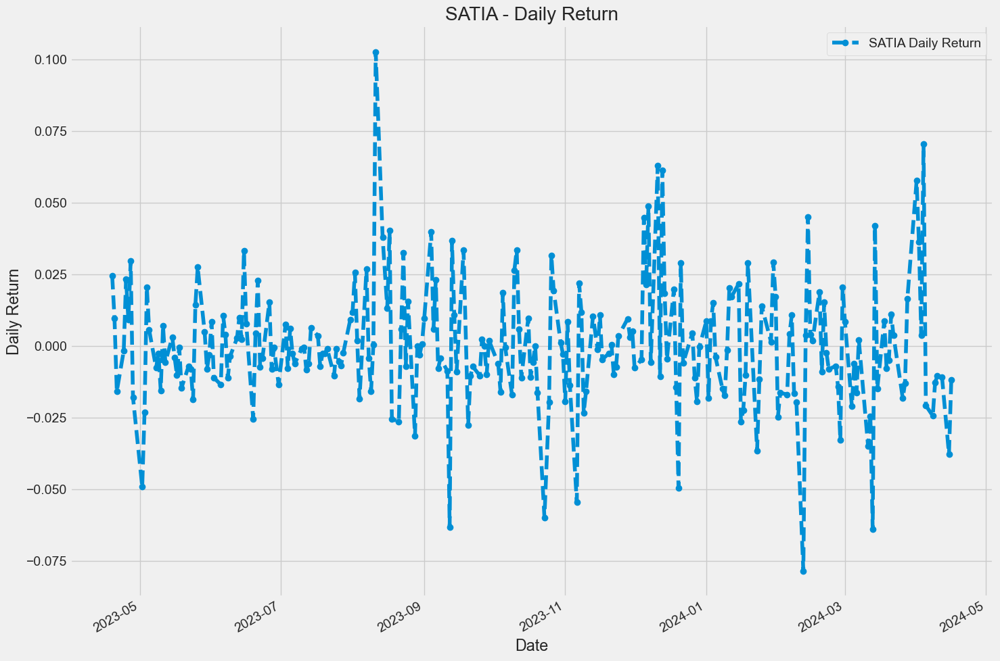

...

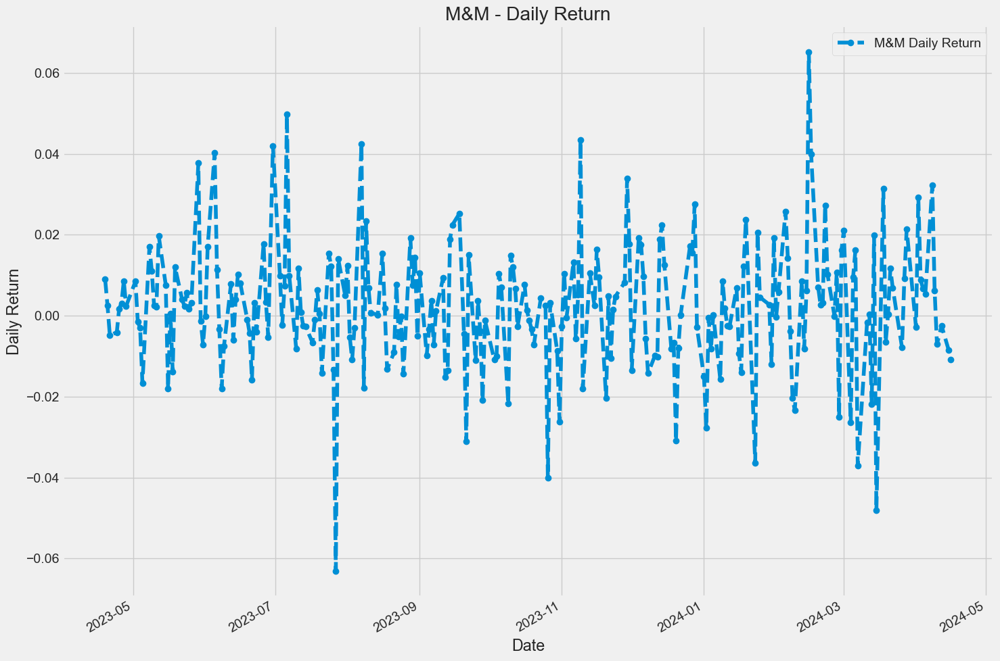

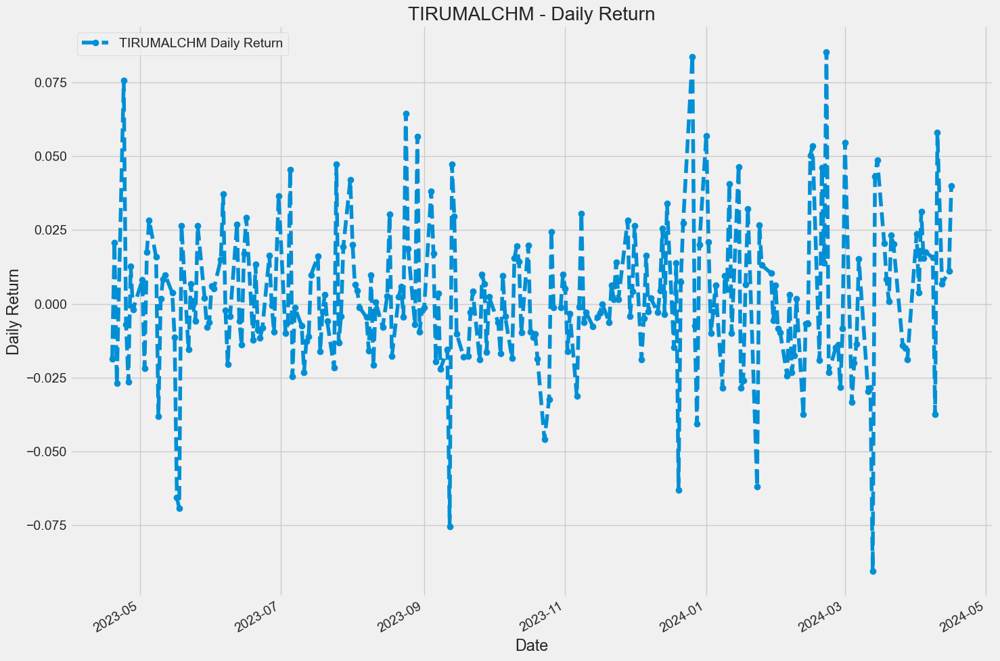

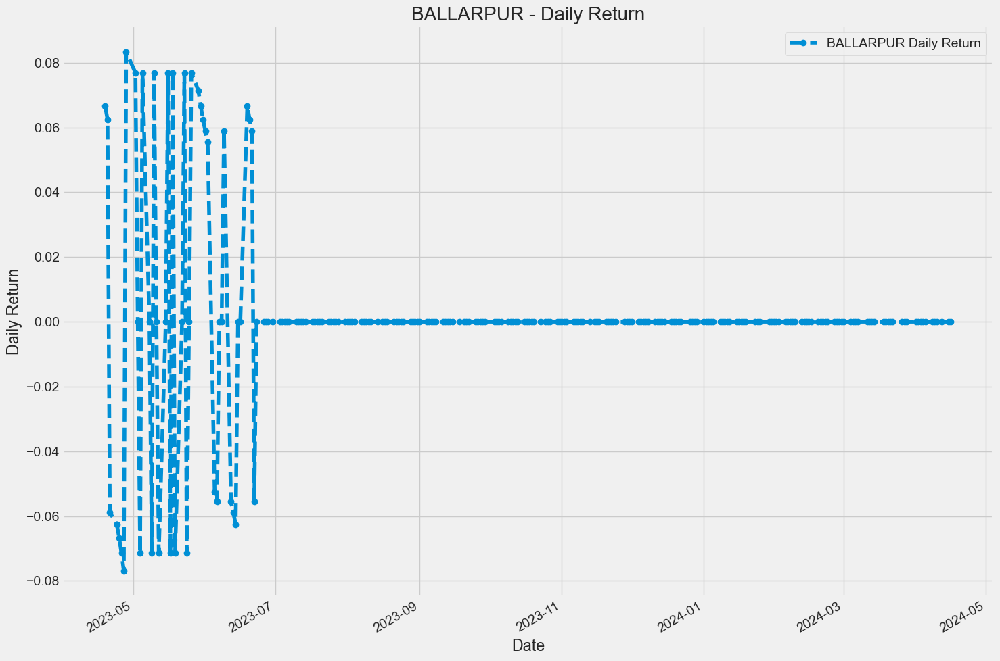

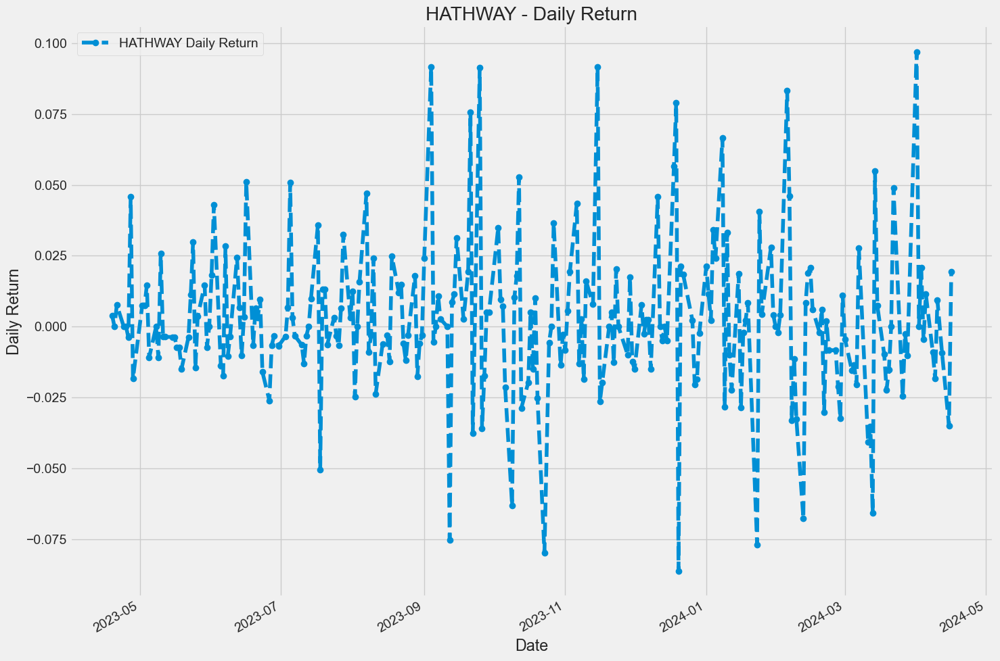

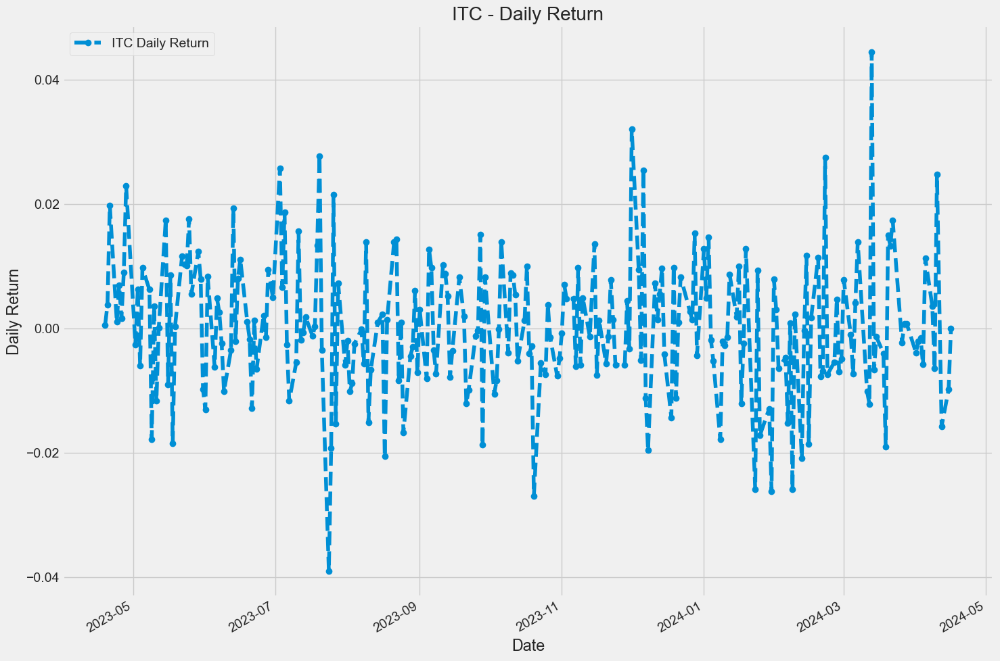

In [96]:
def plot_daily_return(company_df, company_name):
    # We'll use pct_change to find the percent change for each day
    company_df['Daily Return'] = company_df['Adj Close'].pct_change().dropna()

    # Plotting
    plt.figure(figsize=(15, 10))

    company_df['Daily Return'].plot(label=f'{company_name} Daily Return', legend=True, linestyle='--', marker='o')

    plt.title(f"{company_name} - Daily Return")
    plt.xlabel('Date')
    plt.ylabel('Daily Return')
    plt.legend()
    plt.grid(True)

    plt.tight_layout()
    plt.show()

    
    
for com in company_name:
    company_data = globals()[com] 
    plot_daily_return(company_data, com) 


## Daily Return - Histogram

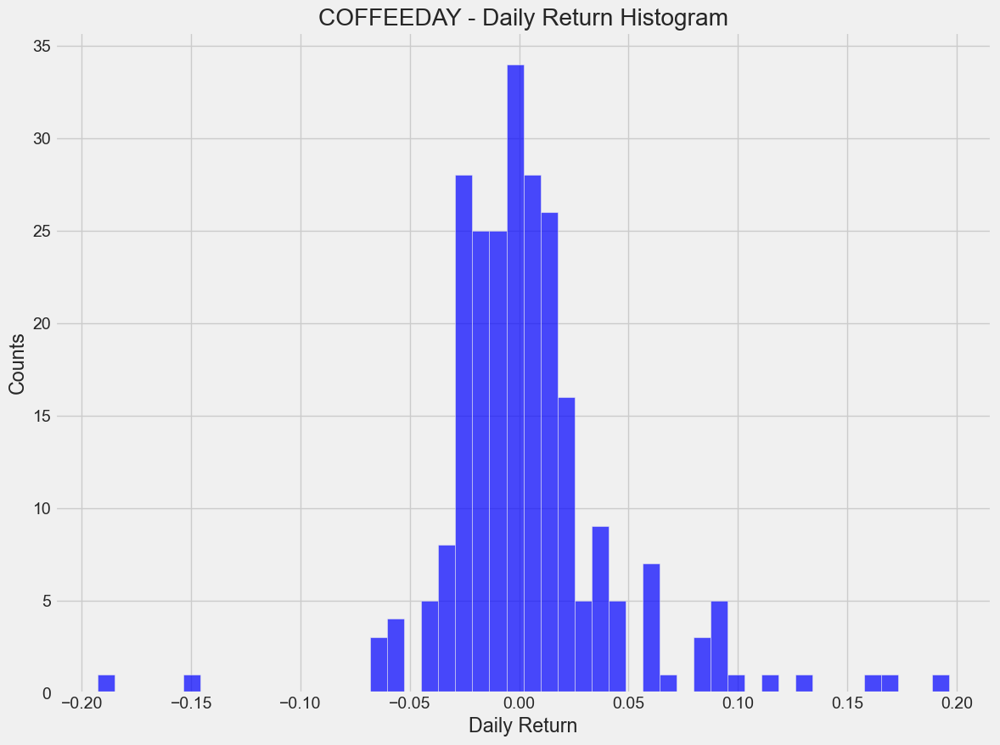

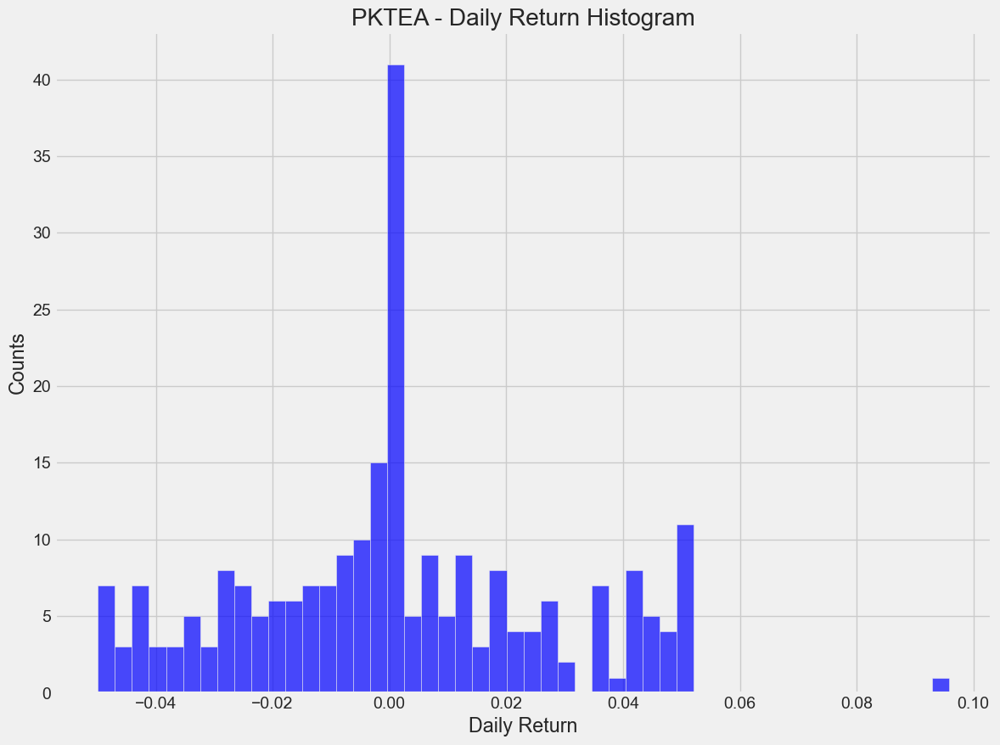

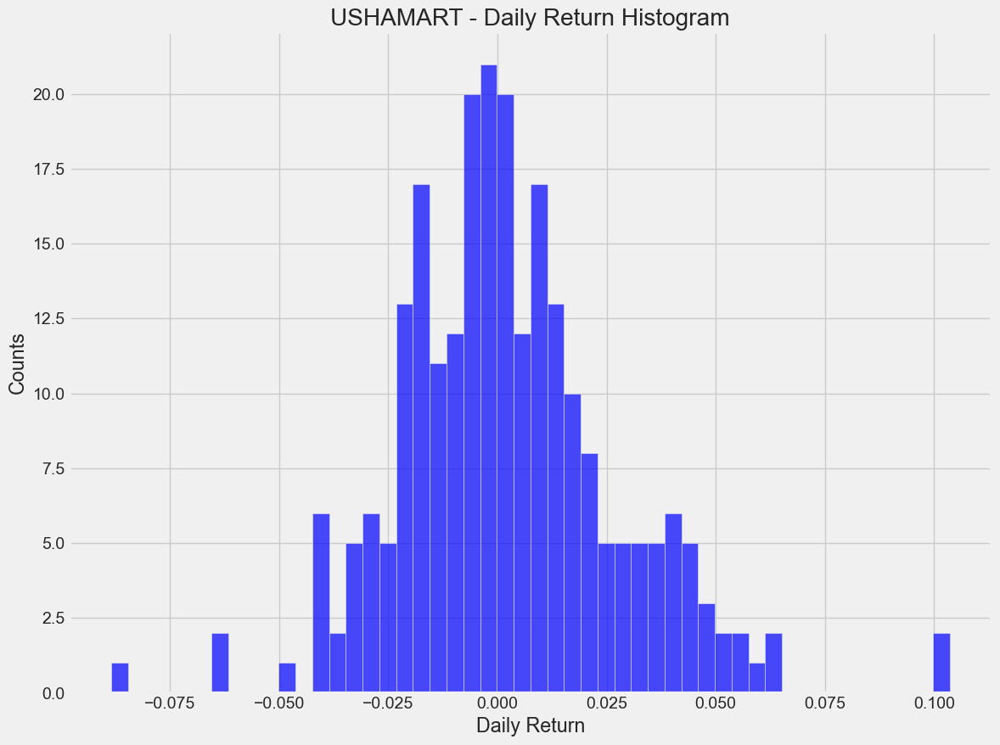

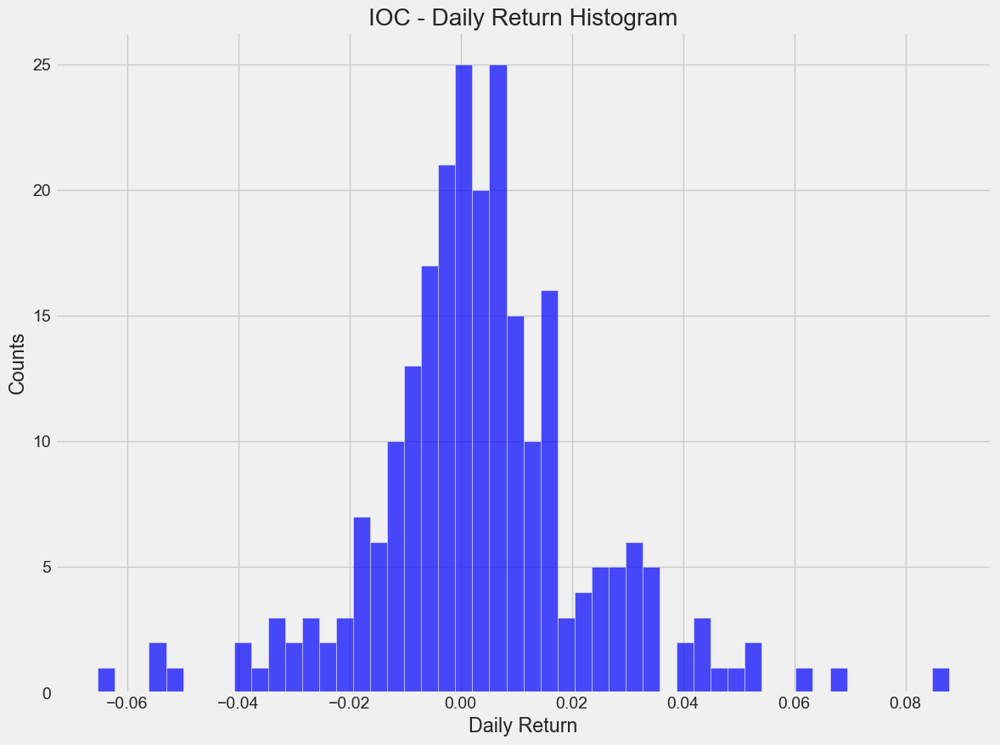

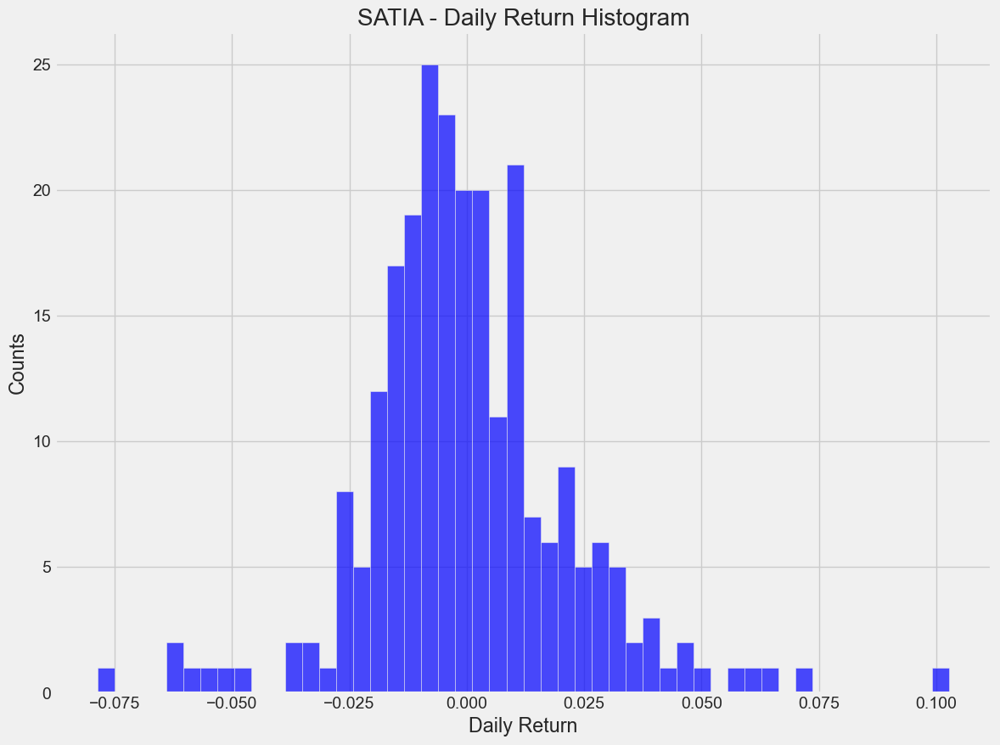

...

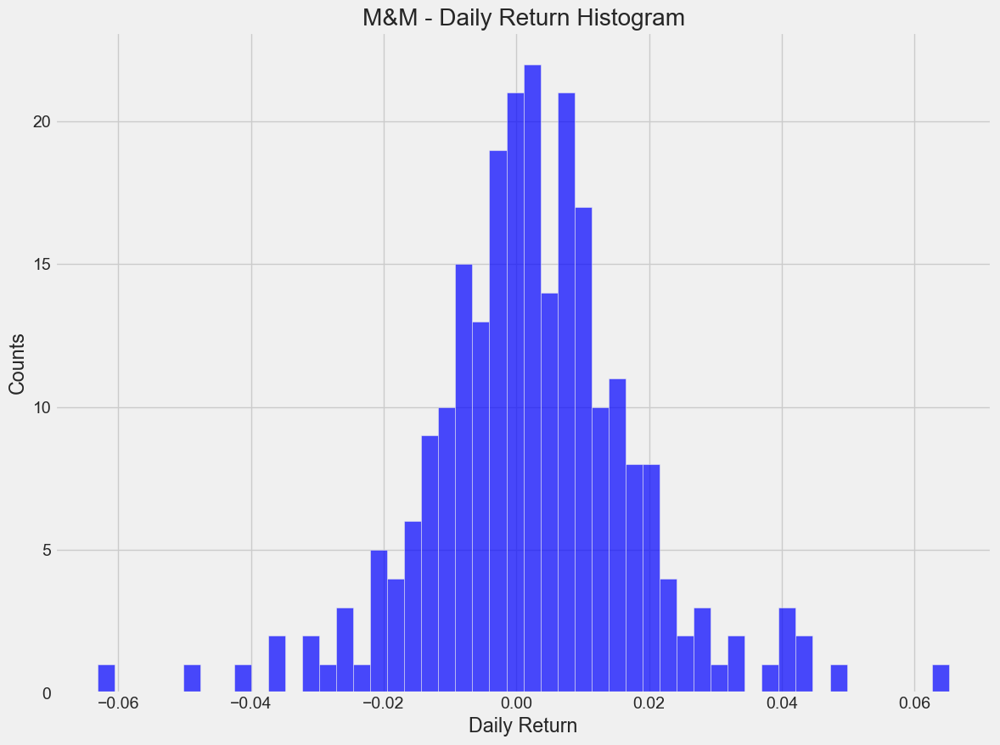

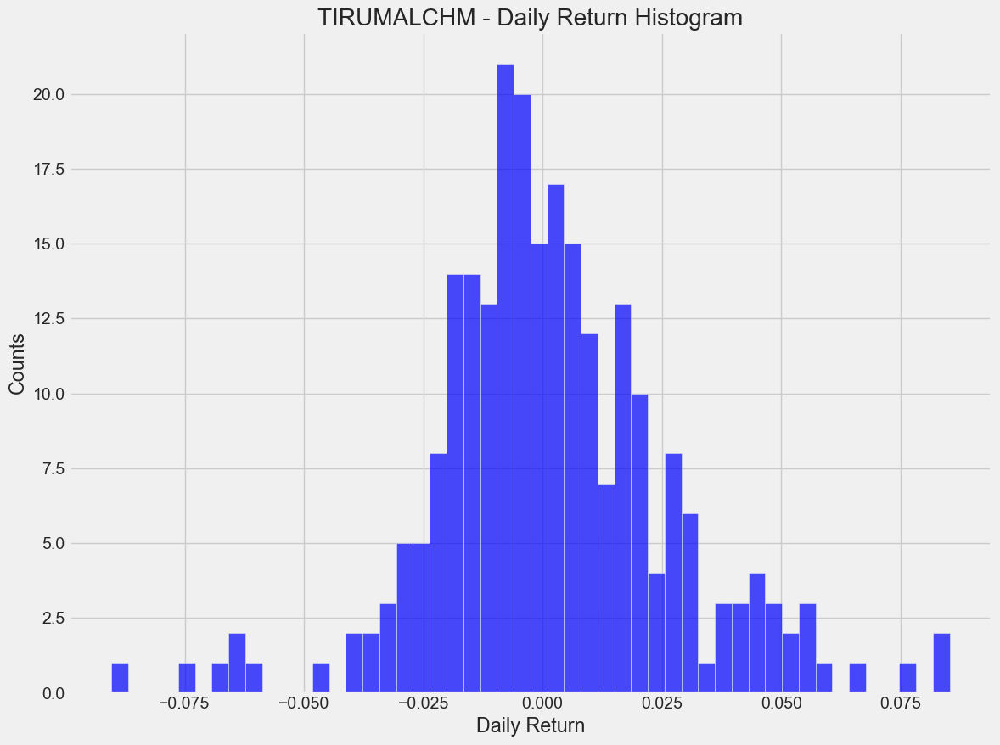

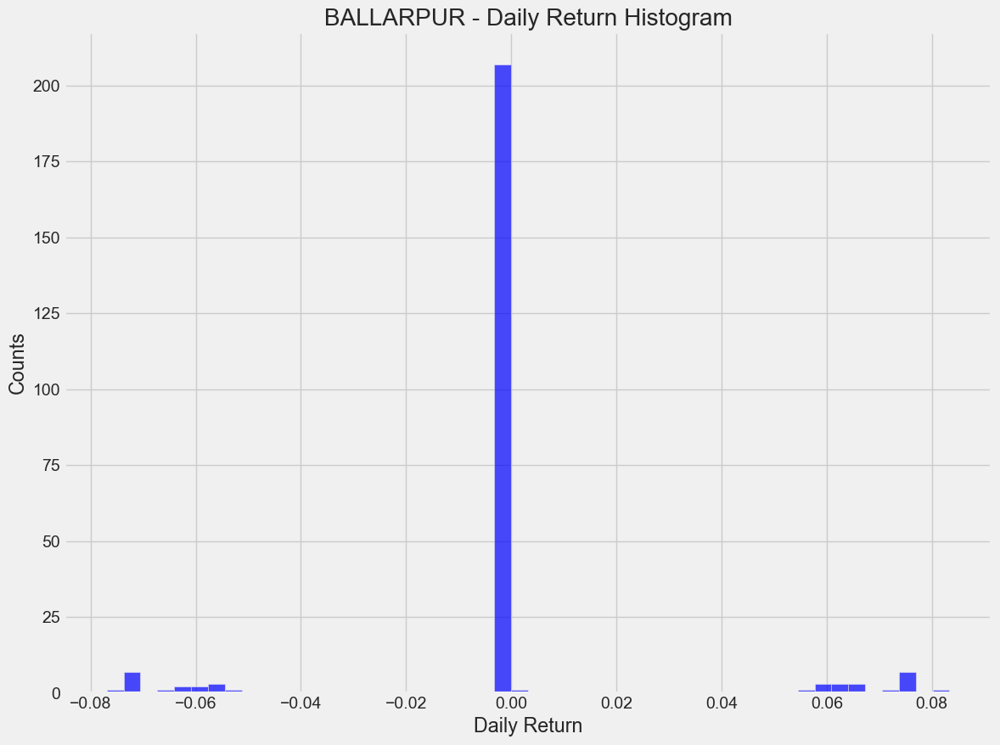

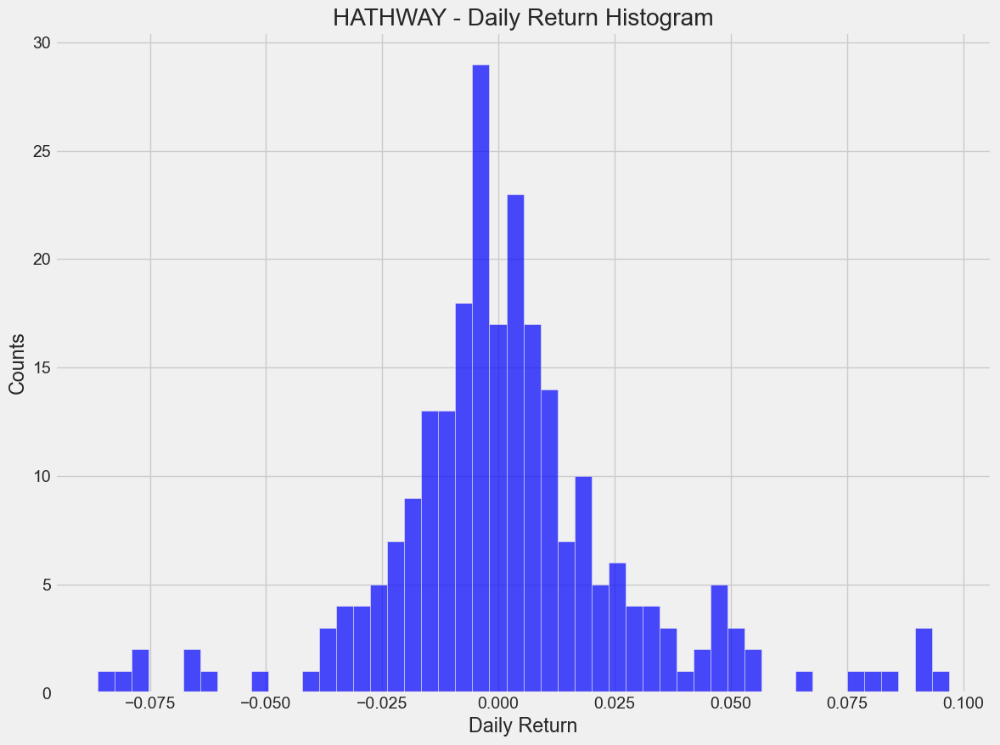

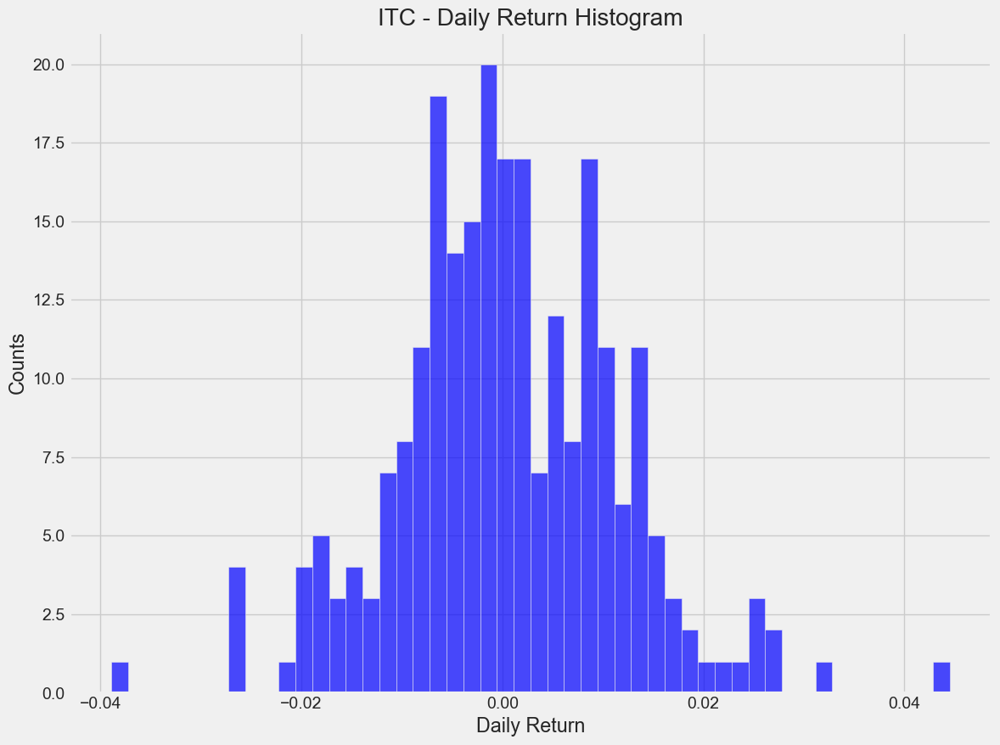

In [98]:
import matplotlib.pyplot as plt

def plot_daily_return_histogram(company_df, company_name):
    plt.figure(figsize=(12, 9))
    
    company_df['Daily Return'].hist(bins=50, color='blue', alpha=0.7)
    
    plt.xlabel('Daily Return')
    plt.ylabel('Counts')
    plt.title(f'{company_name} - Daily Return Histogram')
    
    plt.tight_layout()
    plt.show()
    
    
for com in company_name:
    company_data = globals()[com] 
    plot_daily_return_histogram(company_data, com) 


## Correlation Between Stocks Closing Price

"Correlation tells us how two things are related, with a number between -1.0 and +1.0. It shows if they move together but doesn't say which one causes the other or if there's another reason they're related.

Next, let's make a table with the 'Close' prices of all the stocks we have to look at their returns."

In [106]:
# Grab all the closing prices for the tech stock list into one DataFrame

closing_df = yf.download(stock_list, start=start, end=end)['Adj Close']

# Make a new tech returns DataFrame
tech_rets = closing_df.pct_change()
tech_rets.head()

[*********************100%%**********************]  15 of 15 completed


Ticker,AMRUTANJAN.NS,BALLARPUR.NS,BHARTIARTL.NS,COFFEEDAY.NS,DGCONTENT.NS,HATHWAY.NS,INDLMETER.NS,IOC.NS,ITC.NS,M&M.NS,PKTEA.NS,SATIA.NS,TIRUMALCHM.NS,TVSSRICHAK.NS,USHAMART.NS
Date,,,,,,,,,,,,,,,
2023-04-18,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2023-04-19,0.015129,0.066667,0.006450,-0.012140,0.024221,0.003861,0.000000,0.007051,0.000627,0.008965,-0.018518,0.024601,-0.018581,-0.012659,0.013100
2023-04-20,-0.013622,0.062500,0.010005,-0.023041,0.030405,0.000000,0.000000,-0.004456,0.003887,0.002550,0.000000,0.009688,0.020773,0.016144,0.008394
2023-04-21,-0.006174,-0.058823,-0.009193,0.007862,-0.009836,0.007692,0.000000,0.000639,0.019860,-0.004801,0.000000,-0.015853,-0.026790,0.000353,-0.023622
2023-04-24,-0.015857,-0.062500,-0.006469,-0.001560,-0.003311,0.000000,-0.041096,0.000000,0.001102,-0.004123,0.018868,-0.001696,0.075701,-0.016959,-0.008295


Lets compare the daily percentage return of of stocks to check how correlated

C:\Users\iamra\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


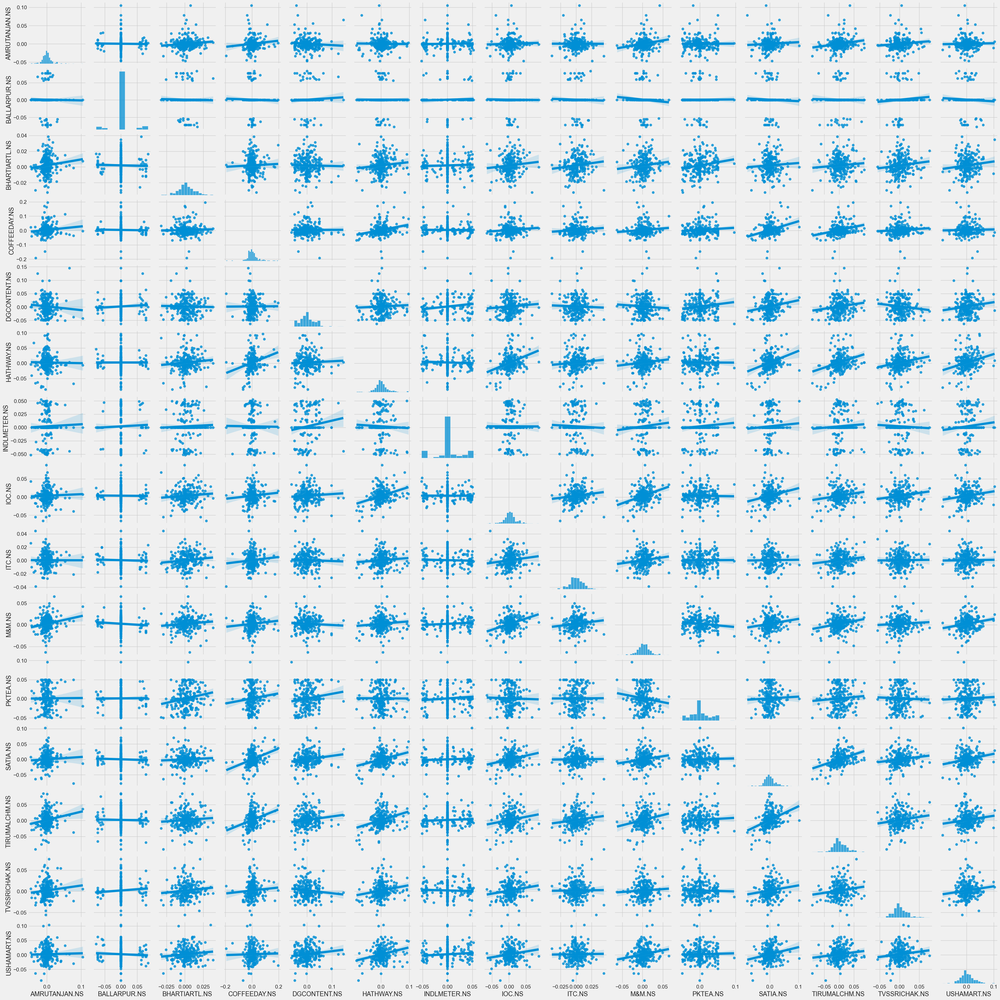

In [108]:
# Pairplot on our DataFrame for an automatic visual analysis of all the comparisons

sns.pairplot(tech_rets, kind='reg')

using sns.PairGrid()

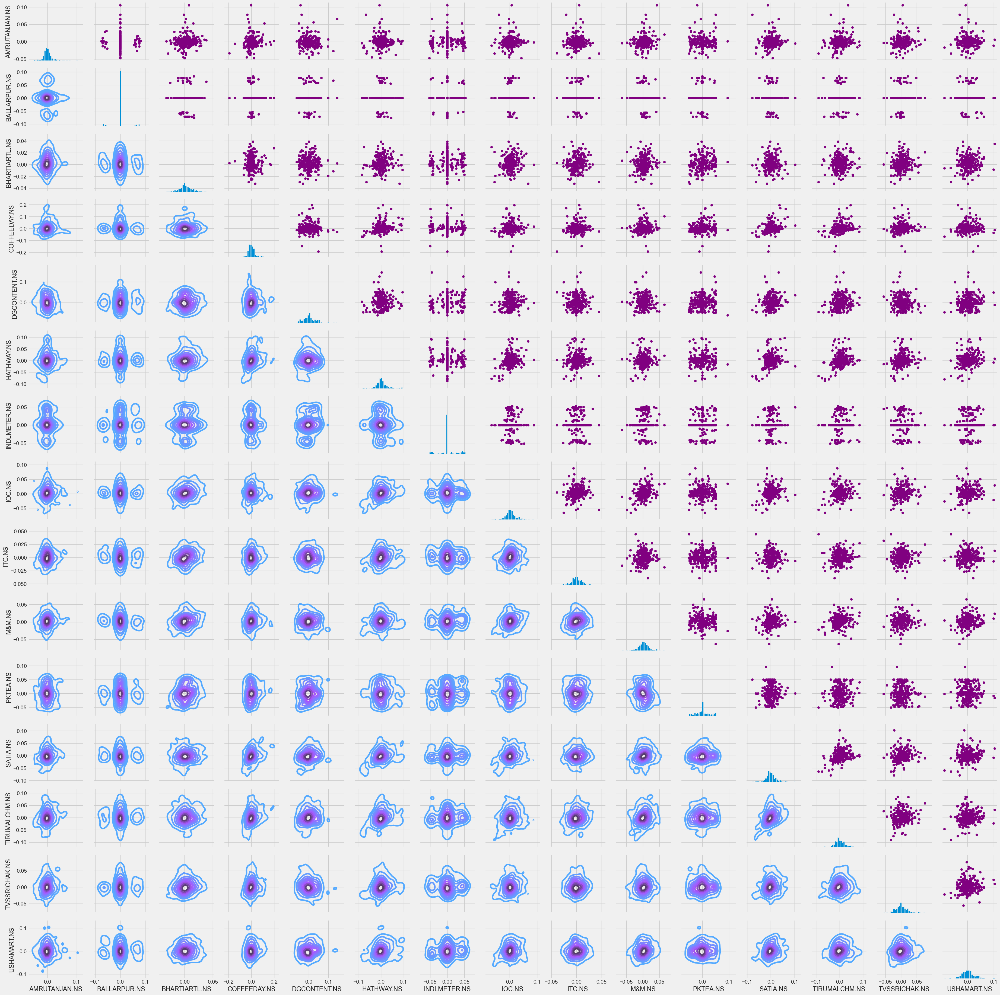

In [107]:
# Set up our figure by naming it returns_fig, call PairPLot on the DataFrame
return_fig = sns.PairGrid(tech_rets.dropna())

# Using map_upper we can specify what the upper triangle will look like.
return_fig.map_upper(plt.scatter, color='purple')

# We can also define the lower triangle in the figure, inclufing the plot type (kde) 
# or the color map (BluePurple)
return_fig.map_lower(sns.kdeplot, cmap='cool_d')

# Finally we'll define the diagonal as a series of histogram plots of the daily return
return_fig.map_diag(plt.hist, bins=30)

Text(0.5, 1.0, 'Correlation of stock return')

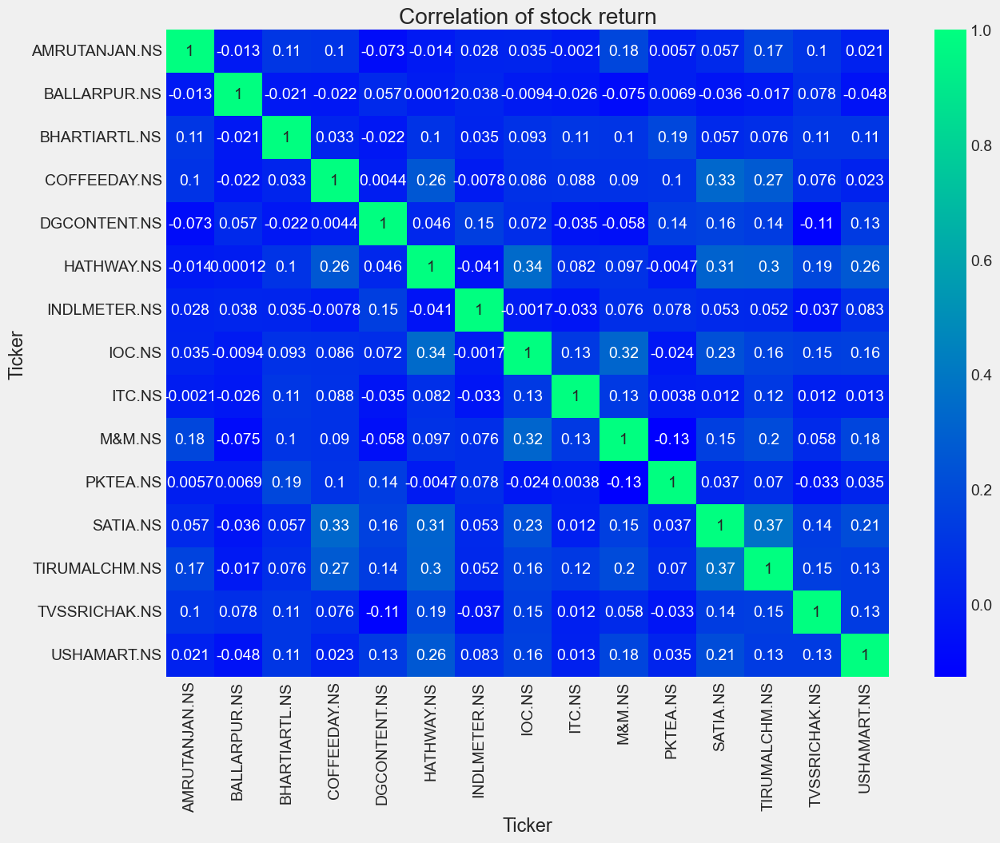

In [111]:
# Correlation of stock return

plt.figure(figsize=(13, 10))
sns.heatmap(tech_rets.corr(), annot=True, cmap='winter')
plt.title('Correlation of stock return')

Text(0.5, 1.0, 'Correlation of stock closing price')

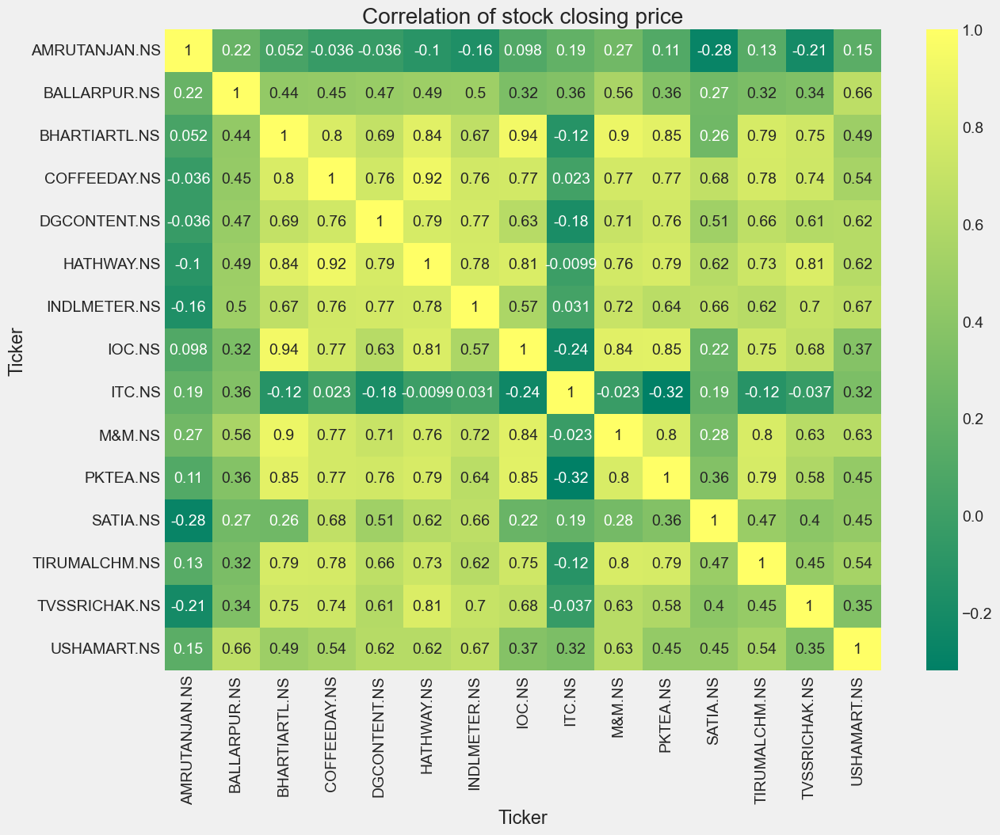

In [113]:
# Correlation of stock closing price

plt.figure(figsize=(13, 10))
sns.heatmap(closing_df.corr(), annot=True, cmap='summer')
plt.title('Correlation of stock closing price')

## Understanding Risk When Investing in a Stock

Risk is calsulated  using the information we've gathered on daily percentage returns is by comparing the expected return with the standard deviation of the daily returns.

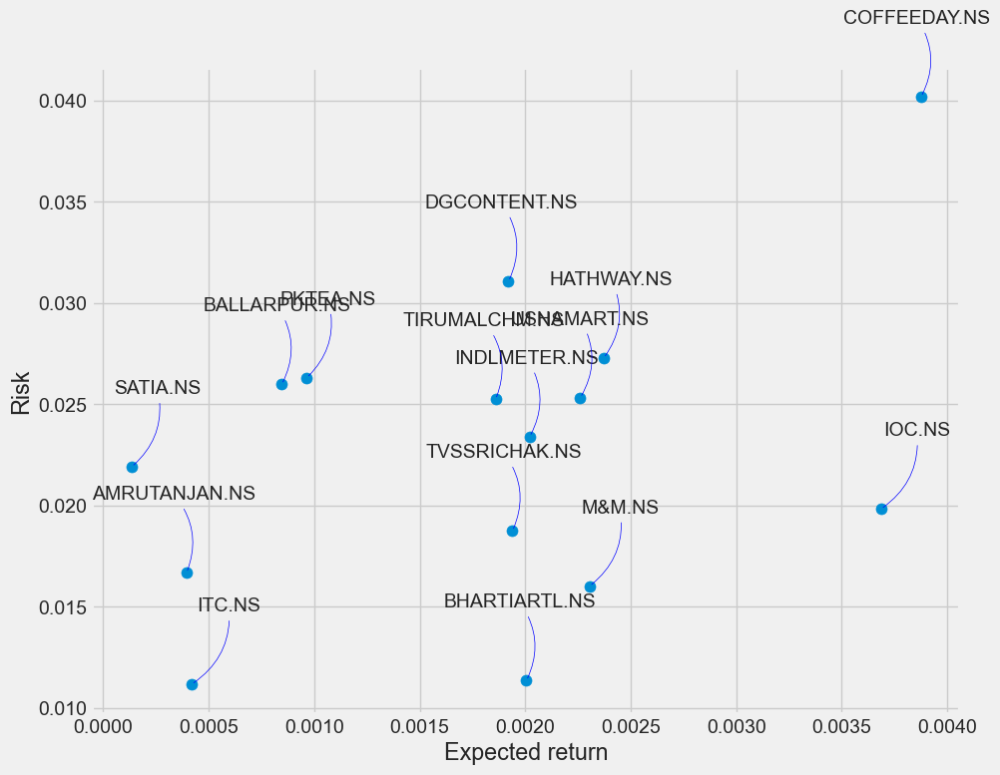

In [114]:
rets = tech_rets.dropna()

area = np.pi * 20

plt.figure(figsize=(10, 8))
plt.scatter(rets.mean(), rets.std(), s=area)
plt.xlabel('Expected return')
plt.ylabel('Risk')

for label, x, y in zip(rets.columns, rets.mean(), rets.std()):
    plt.annotate(label, xy=(x, y), xytext=(50, 50), textcoords='offset points', ha='right', va='bottom', 
                 arrowprops=dict(arrowstyle='-', color='blue', connectionstyle='arc3,rad=-0.3'))

In [210]:
# Risk Analysis Dataframe

rets_mean = tech_rets.mean()
rets_std = tech_rets.std()


df_stats = pd.DataFrame({
    'Expected Return': rets_mean,
    'Risk': rets_std,
    'company':rets.columns
})

# Print the DataFrame
print(df_stats)

               Expected Return      Risk        company
Ticker                                                 
AMRUTANJAN.NS         0.000395  0.016669  AMRUTANJAN.NS
BALLARPUR.NS          0.000846  0.025977   BALLARPUR.NS
BHARTIARTL.NS         0.002006  0.011347  BHARTIARTL.NS
COFFEEDAY.NS          0.003876  0.040185   COFFEEDAY.NS
DGCONTENT.NS          0.001921  0.031070   DGCONTENT.NS
HATHWAY.NS            0.002372  0.027280     HATHWAY.NS
INDLMETER.NS          0.002021  0.023398   INDLMETER.NS
IOC.NS                0.003686  0.019825         IOC.NS
ITC.NS                0.000418  0.011161         ITC.NS
M&M.NS                0.002305  0.016014         M&M.NS
PKTEA.NS              0.000964  0.026303       PKTEA.NS
SATIA.NS              0.000135  0.021909       SATIA.NS
TIRUMALCHM.NS         0.001859  0.025237  TIRUMALCHM.NS
TVSSRICHAK.NS         0.001939  0.018741  TVSSRICHAK.NS
USHAMART.NS           0.002261  0.025323    USHAMART.NS


In [211]:
#Low risk
df_stats.loc[df_stats['Risk'] < 0.02, 'Risk Level'] = 'Low'
df_stats[df_stats['Risk']<0.02]

,Expected Return,Risk,company,Risk Level
Ticker,,,,
AMRUTANJAN.NS,0.000395,0.016669,AMRUTANJAN.NS,Low
BHARTIARTL.NS,0.002006,0.011347,BHARTIARTL.NS,Low
IOC.NS,0.003686,0.019825,IOC.NS,Low
ITC.NS,0.000418,0.011161,ITC.NS,Low
M&M.NS,0.002305,0.016014,M&M.NS,Low
TVSSRICHAK.NS,0.001939,0.018741,TVSSRICHAK.NS,Low


In [212]:
# Medium Risk
df_stats.loc[(df_stats['Risk'] >= 0.02) & (df_stats['Risk'] < 0.03), 'Risk Level'] = 'Medium'

df_stats[(df_stats['Risk'] >= 0.02) & (df_stats['Risk'] < 0.03)]

,Expected Return,Risk,company,Risk Level
Ticker,,,,
BALLARPUR.NS,0.000846,0.025977,BALLARPUR.NS,Medium
HATHWAY.NS,0.002372,0.027280,HATHWAY.NS,Medium
INDLMETER.NS,0.002021,0.023398,INDLMETER.NS,Medium
PKTEA.NS,0.000964,0.026303,PKTEA.NS,Medium
SATIA.NS,0.000135,0.021909,SATIA.NS,Medium
TIRUMALCHM.NS,0.001859,0.025237,TIRUMALCHM.NS,Medium
USHAMART.NS,0.002261,0.025323,USHAMART.NS,Medium


In [213]:
# high Risk
df_stats.loc[df_stats['Risk'] >= 0.03, 'Risk Level'] = 'High'
df_stats[(df_stats['Risk'] >= 0.03)]

,Expected Return,Risk,company,Risk Level
Ticker,,,,
COFFEEDAY.NS,0.003876,0.040185,COFFEEDAY.NS,High
DGCONTENT.NS,0.001921,0.031070,DGCONTENT.NS,High


In [214]:
# Risk Level Dataframe

df_stats

,Expected Return,Risk,company,Risk Level
Ticker,,,,
AMRUTANJAN.NS,0.000395,0.016669,AMRUTANJAN.NS,Low
BALLARPUR.NS,0.000846,0.025977,BALLARPUR.NS,Medium
BHARTIARTL.NS,0.002006,0.011347,BHARTIARTL.NS,Low
COFFEEDAY.NS,0.003876,0.040185,COFFEEDAY.NS,High
DGCONTENT.NS,0.001921,0.031070,DGCONTENT.NS,High
HATHWAY.NS,0.002372,0.027280,HATHWAY.NS,Medium
INDLMETER.NS,0.002021,0.023398,INDLMETER.NS,Medium
IOC.NS,0.003686,0.019825,IOC.NS,Low
ITC.NS,0.000418,0.011161,ITC.NS,Low


In [215]:
today_date = datetime.today().strftime('%Y-%m-%d')
df_stats.to_csv(f"Stocks_Risk_level_{today_date}.csv", index=False)

  ## Mapping of Customer Clusters and Stock Risk

In [216]:
# Reading the customer cluster data

customer_df = pd.read_csv('Clustered_Data_final.csv')
customer_df['Cluster Label'] = customer_df['Cluster Label'].replace({'L': 'Low', 'M': 'Medium', 'H': 'High'})
customer_df = customer_df.rename(columns={'Cluster Label': 'Risk Level'})

In [217]:
customer_df.head()

,Customer ID,Full Name,Date of Birth,Gender,Annual Income,Previous Investment Experience,Amount to Invest,Expected Rate of Return,Term of Investment,Retirement Goals,Employment Type,Investor Type,Investor Type Encoded,Cluster,Risk Level
0,a25cbb59-a1d6-48a4-88d7-ba256994d2b6,Jessica Garrett,1959-07-28,Female,154874,Yes,108032,5-10%,Medium Term,Saving for children's education,Employed,Moderate,1,0,Medium
1,06948085-536d-4017-b2c3-3bb832712ffe,Paul Brown,1992-01-10,Female,284123,Yes,492021,>10%,Long Term,Saving for vacation,Employed,Aggressive,2,1,High
2,42e33806-ed97-4f59-a027-62981b5c5f85,Brittany Martin,1961-08-19,Other,583940,No,444974,5-10%,Long Term,Investing in a business venture,Employed,Moderate,1,0,Medium
3,aeb7a294-1405-4097-bff6-462ac465812b,John Martin,1974-01-06,Female,768825,Yes,498445,5-10%,Medium Term,Paying off college debt,Unemployed,Aggressive,2,1,High
4,c547ef84-4bb6-44bd-a853-e8c5a7c2be8d,John Nelson,1992-06-12,Male,977469,No,335530,5-10%,Short Term,Buying a house,Employed,Aggressive,2,1,High


In [218]:
df_stats['Risk Level'].unique()

array(['Low', 'Medium', 'High'], dtype=object)

In [219]:
customer_df['Risk Level'].unique()

array(['Medium', 'High', 'Low'], dtype=object)

In [220]:
merged_df = pd.merge(customer_df, df_stats, on='Risk Level', how = 'inner')

In [221]:
merged_df['Risk Level'].unique()

array(['Medium', 'High', 'Low'], dtype=object)

## Recommendation for Investing in a Stock

In [222]:
grouped_df = merged_df.groupby('Risk Level').agg({
    'Full Name': lambda x: list(x),
    'company': lambda x: list(x)
})

grouped_df


,Full Name,company
Risk Level,,
High,"[Paul Brown, Paul Brown, John Martin, John Mar...","[COFFEEDAY.NS, DGCONTENT.NS, COFFEEDAY.NS, DGC..."
Low,"[Chad Jackson, Chad Jackson, Chad Jackson, Cha...","[AMRUTANJAN.NS, BHARTIARTL.NS, IOC.NS, ITC.NS,..."
Medium,"[Jessica Garrett, Jessica Garrett, Jessica Gar...","[BALLARPUR.NS, HATHWAY.NS, INDLMETER.NS, PKTEA..."
